# Problem - 1

#### Context
The comp-activ database comprises activity measures of computer systems. Data was gathered from a Sun Sparcstation 20/712 with 128 Mbytes of memory, operating in a multi-user university department. Users engaged in diverse tasks, such as internet access, file editing, and CPU-intensive programs.
Being an aspiring data scientist, you aim to establish a linear equation for predicting 'usr' (the percentage of time CPUs operate in user mode). Your goal is to analyze various system attributes to understand their influence on the system's 'usr' mode.

## Problem 1 - Define the problem and perform exploratory Data Analysis

### Problem definition

The comp-activ database comprises activity measures of computer systems. Data was gathered from a Sun Sparcstation 20/712 with 128 Mbytes of memory, operating in a multi-user university department. Users engaged in diverse tasks, such as internet access, file editing, and CPU-intensive programs. The goal is to establish a linear equation for predicting 'usr' (the percentage of time CPUs operate in user mode). This involves analyzing various system attributes to understand their influence on the system's 'usr' mode.

In [240]:
#Libaries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

#load Dataset
data = pd.read_excel("compactiv.xlsx")
data.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


### Check shape, Data types, statistical summary

In [241]:
data.shape

(8192, 22)

In [242]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [243]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


#### Key Insights from the Data

- The dataset has 8192 rows and 22 columns.

- The dataset has only one categorical variable and 21 numerical variable

- The dataset has 13 float type variable, 8 int type variable, 1 object type variable

- System Memory Reads and Writes:
lread (Reads): Mean of 19.56 with a large standard deviation (53.35) indicates high variability in memory reads, ranging from 0 to 1845.
lwrite (Writes): Mean of 13.11 and standard deviation of 29.89, also showing significant variability, ranging from 0 to 575.

- System Calls and Read/Write Calls:
scall (System Calls): High mean of 2306.32 and a wide range from 109 to 12493, indicating a high frequency of system calls.
sread (System Read Calls): Mean of 210.48 and standard deviation of 198.98, suggesting moderate variability with some extreme values up to 5318.
swrite (System Write Calls): Mean of 150.06, indicating fewer write calls compared to read calls, with values up to 5456.

- Process Management:
fork: Mean of 1.88 with a range from 0 to 20.12.
exec: Mean of 2.79 and a wide range up to 59.56, indicating variability in process execution calls.

- Character Transfers:
rchar (Read Characters): High mean of 197385.7, indicating substantial data transfer via read calls, with extreme values up to 2526649.
wchar (Write Characters): Mean of 95902.99, suggesting considerable data transfer via write calls, with values up to 1801623.

- Page Management:
pgout and ppgout: Low means (2.29 and 5.98, respectively) with some extreme values, indicating occasional high page-out activities.
pgfree and pgscan: Low means (11.92 and 21.53, respectively) but high standard deviations, indicating sporadic high values.
pgin and ppgin: Mean values (8.28 and 12.39, respectively) with high standard deviations, suggesting occasional high page-in activities.

- Page Faults:
pflt and vflt: Mean values (109.79 and 185.32, respectively) with significant variability, indicating a frequent occurrence of page faults.

- Memory and Swap Space:
freemem: Mean of 1763.46, indicating available memory, with values ranging from 55 to 12027.
freeswap: Mean of 1328126, indicating a substantial amount of swap space, with values ranging from 2 to 2243187.

- CPU User Mode (usr):
Mean of 83.97 with a standard deviation of 18.40, suggesting that CPUs spend a significant amount of time in user mode, with values ranging from 0 to 99.

#### Observations:
- There is high variability in system read and write operations (lread, lwrite).
- System calls (scall) occur frequently and show high variability.
- Character transfers (rchar, wchar) have high means and variability, indicating significant data transfer.
- Page management metrics (pgout, pgin, pgfree, pgscan) have low means but occasional high values.
- Page faults (pflt, vflt) occur frequently with significant variability.
- Substantial amounts of memory and swap space are available.
- CPUs spend a significant portion of time in user mode, with occasional full utilization (usr up to 99%).

### Univariate analysis:

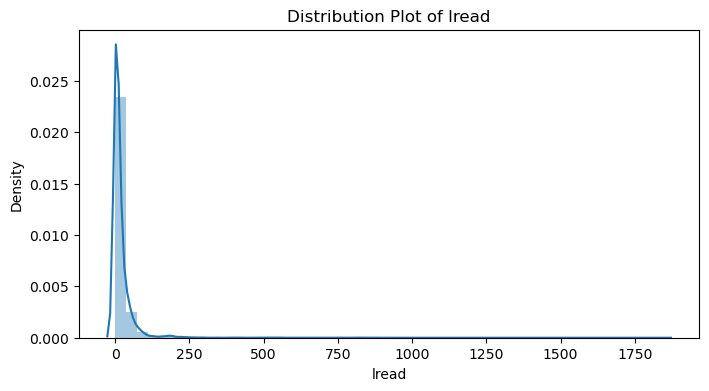

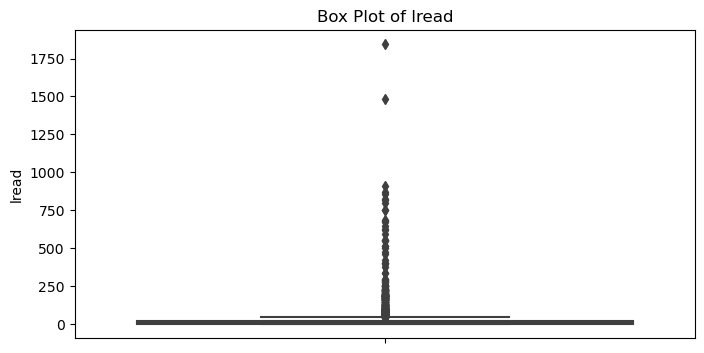

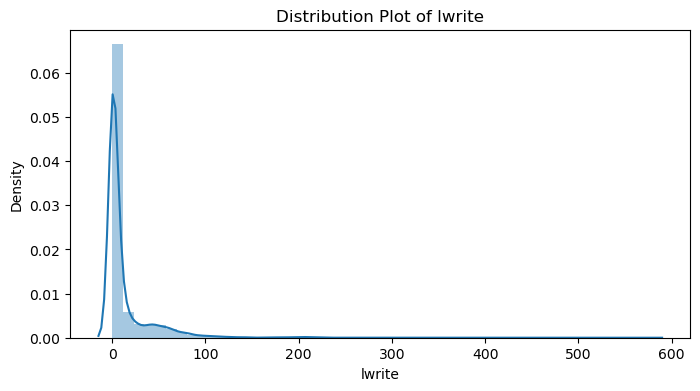

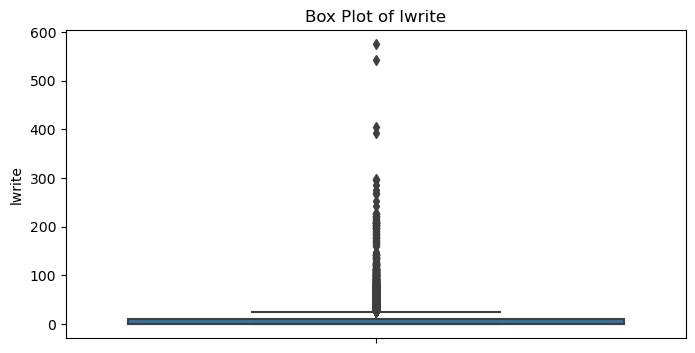

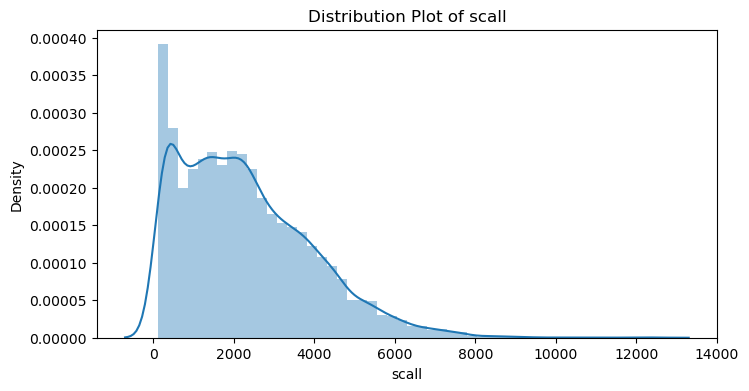

...

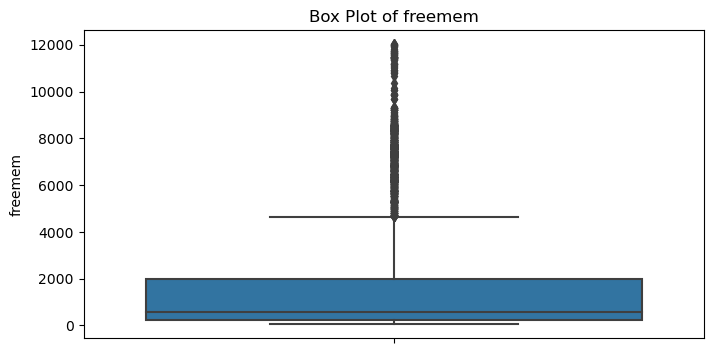

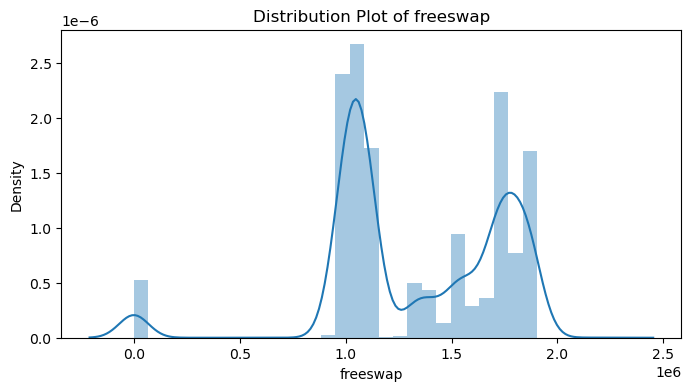

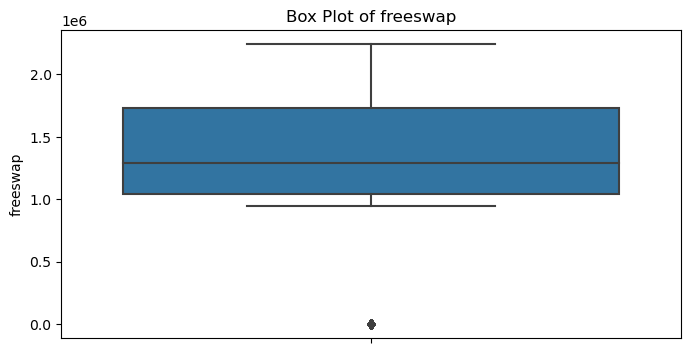

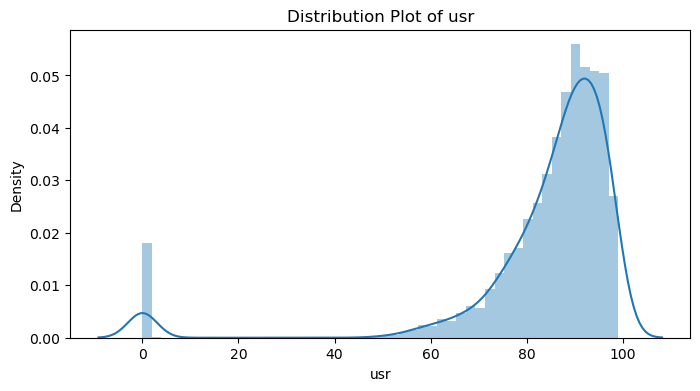

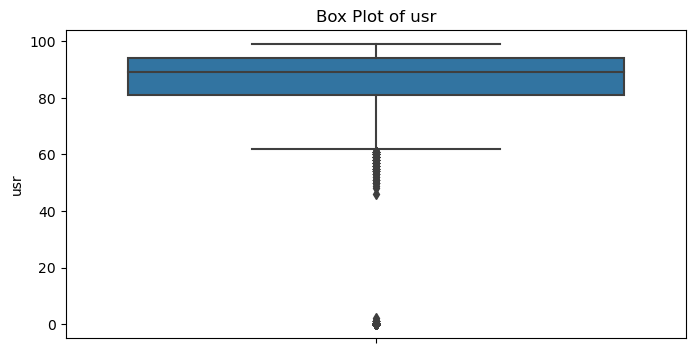

In [244]:
# Numerical columns
numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns

# Univariate analysis for numerical columns
for col in numeric_cols:
  # Distribution plot
  plt.figure(figsize=(8, 4))
  sns.distplot(data[col])
  plt.title(f'Distribution Plot of {col}')
  plt.show()

  # Box plot
  plt.figure(figsize=(8, 4))
  sns.boxplot(y=data[col])
  plt.title(f'Box Plot of {col}')
  plt.show()

In [245]:
numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns

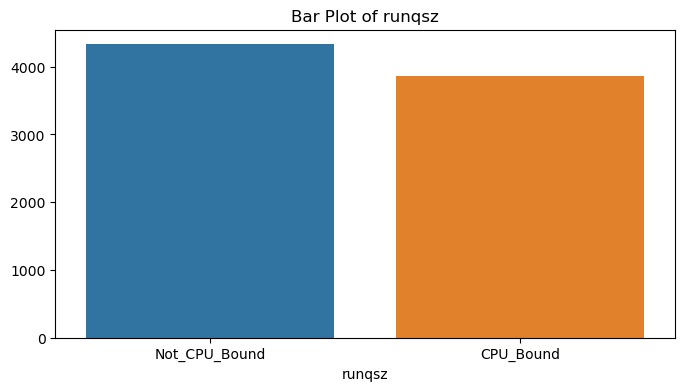

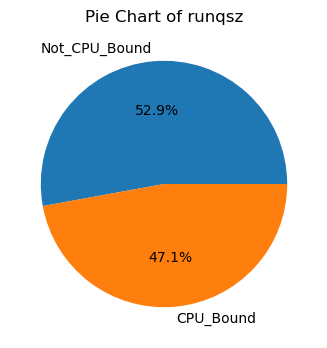

In [246]:
# Categorical columns
categorical_cols = data.select_dtypes(include=['object']).columns

# Univariate analysis for categorical columns
for col in categorical_cols:
  # Bar plot
  plt.figure(figsize=(8, 4))
  sns.barplot(x=data[col].value_counts().index, y=data[col].value_counts().values)
  plt.title(f'Bar Plot of {col}')
  plt.show()

  # Pie chart
  plt.figure(figsize=(8, 4))
  plt.pie(data[col].value_counts().values, labels=data[col].value_counts().index, autopct="%1.1f%%")
  plt.title(f'Pie Chart of {col}')
  plt.show()

#### Insights:
- The distributions are all right-skewed, meaning that most values are clustered near zero, with a long tail of higher values. The median and interquartile range (IQR) for each metric are close to zero, indicating that the middle 50% of the data points are very low and close to each other. There are several outliers beyond the whiskers, which suggests that there are significant instances where these metrics spike to very high levels. The presence of outliers and skewness indicates that statistical methods that assume normality might not be appropriate without transformation, and that robust regression or outlier removal techniques might be necessary in predictive modeling
- The "Not_CPU_Bound" category has a higher "runqsz" value, indicating a larger queue size compared to the "CPU_Bound" category. The difference between the two categories is roughly 500 units. The "Not_CPU_Bound" category covers 52.9% of the data, while the "CPU_Bound" category covers 47.1%. This suggests that the majority of the data points have a run queue size less than 2, with the "Not_CPU_Bound" category having the largest proportion of these instances.



### Multivariate analysis:

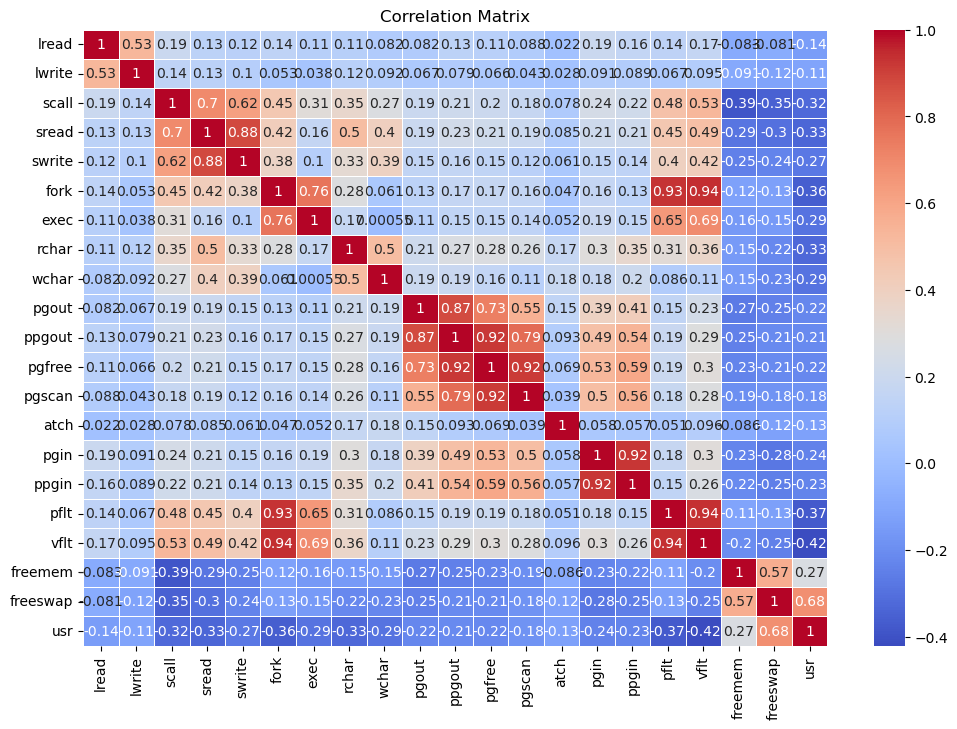

In [29]:
# for numerical data
numerical_data = data.select_dtypes(include=['int64', 'float64'])
correlation_matrix = numerical_data.corr()

# heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


<Figure size 1200x800 with 0 Axes>

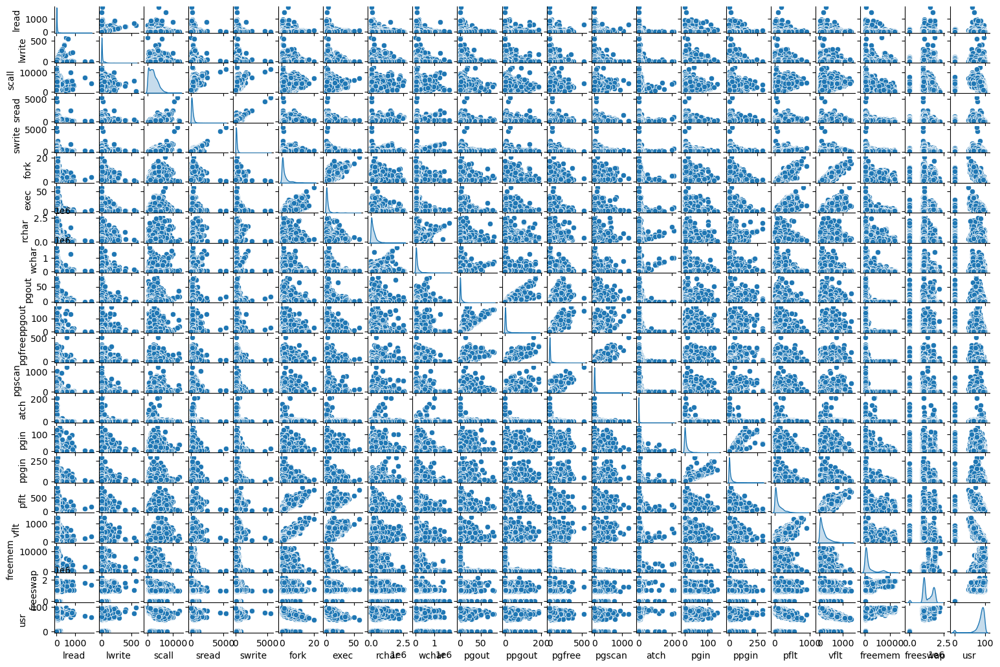

In [28]:
# Pairplot
plt.figure(figsize=(12, 8))
sns.pairplot(numerical_data, diag_kind='kde', height=2.5)
plt.gcf().set_size_inches(15, 10)
plt.show()

#### Insights:
- Right-Skewed Distributions: Most variables have right-skewed distributions, indicating that most values are clustered near zero with a few higher values.
- Correlations: Strong positive correlations are observed between several pairs of variables, such as swrite and sread, fork and exec, pgfree and pgscan, and pflt and vflt. These correlations suggest that these variables tend to increase together.
- Negative Correlations: A few negative correlations are observed, such as between lread and lwrite, and freemem and usr. These correlations suggest that these variables tend to move in opposite directions.
- Outliers: Several scatterplots show the presence of outliers, particularly in variables like lread, pgfree, and pgscan. These outliers can significantly impact the analysis and should be investigated further.
- Implications: The strong positive relationships can be leveraged in predictive modeling, while understanding these relationships can help in optimizing resource allocation and performance tuning.


<Figure size 2000x1500 with 0 Axes>

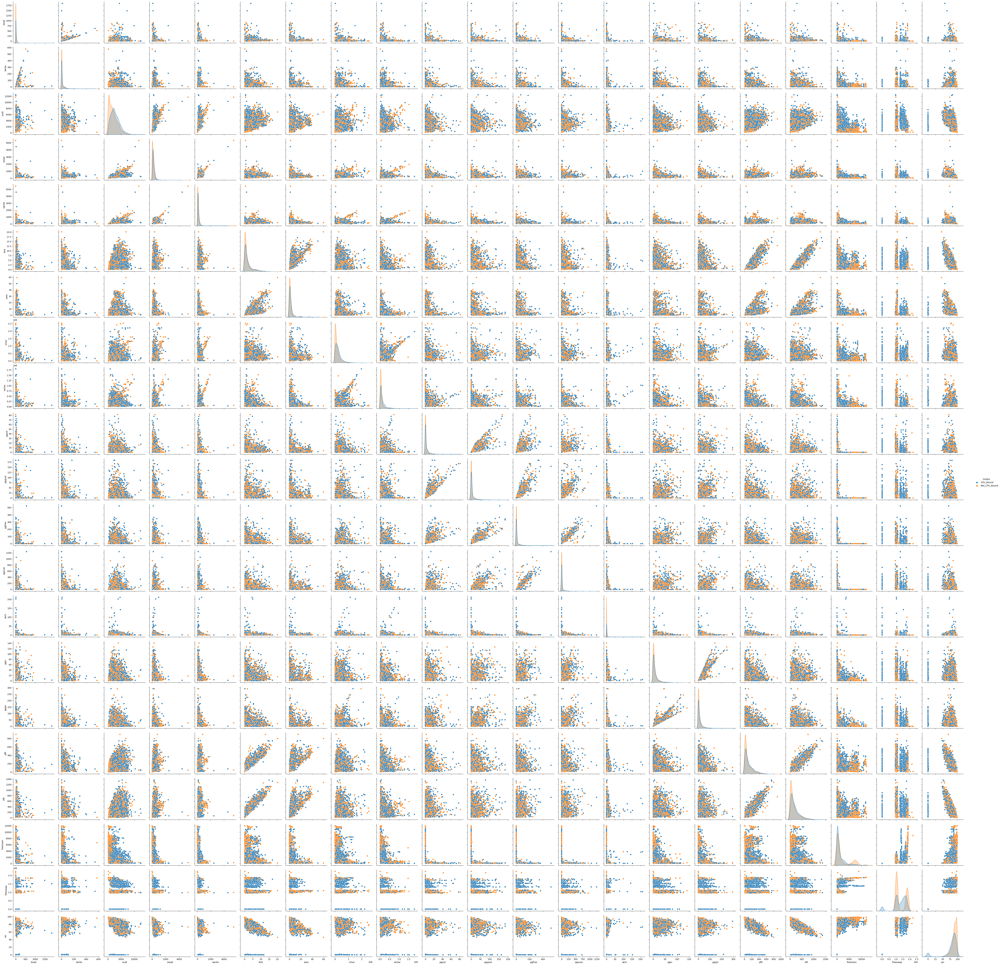

In [43]:

plt.figure(figsize=(20, 15))
sns.pairplot(data, hue='runqsz', height=3)
plt.show()


#### Insights

- Strong Positive Relationships: swrite with sread, fork with exec, pgfree with pgscan, pflt with vflt.

- Moderate Positive Relationships: scall with sread, pgin with pgpin.

- Negative Relationships: freemem with usr.

- Outliers: Multiple scatterplots indicate the presence of outliers, particularly in variables like lread, pgfree, and pgscan.

- Distributions: The distributions of variables vary, with some showing skewness.

### Use appropriate visualizations to identify the patterns and insights

- Above we have Histogram & box plot for Individual Numerical data and Bar plot & pie chart for Individual categorical data. 
- For Comparison of multple numerical data we have heatmap & pairplot.
- For Comparison between multiple numerical and categorical data we have pairplot with digonal showing the categorical data distribution

### Key meaningful observations on individual variables and the relationship between variables

- #### lread:
    - Right-Skewed Distributions: Most variables have right-skewed distributions, indicating that most values are clustered near zero with a few higher values.
    - High Density Near Zero: The majority of data points have lower values, indicating that lower values are much more common.
    - Long Tail: The plots have long tails extending towards higher values, indicating the presence of some high values, but these are much less frequent compared to the lower values.
    - Potential Outliers: The presence of the long tail suggests there may be outliers or extreme values far from the mean, which can have significant effects on the mean but less on the median.
    - Central Tendency: The median is located close to the lower end of the scale, and the interquartile range (IQR) is quite narrow, indicating that the middle 50% of the data points are close to each other and clustered towards the lower end of the scale.
    - Whiskers and Outliers: The whiskers are very short, suggesting that the majority of the data points are not spread out widely. There are numerous outliers beyond the whiskers, particularly in variables like "Iread" and "lwrite".
    - Skewness: The distributions are right-skewed due to the presence of higher values and the outliers extending significantly beyond the upper whisker.
    - Implications: The high skewness suggests that these variables may not follow a normal distribution, which could affect certain statistical analyses that assume normality. Transformations (e.g., log transformation) might be necessary if normality is a requirement for the analysis. The presence of outliers should be considered in further analysis, as they can significantly impact model performance and interpretation.
    
- #### lwrite:
    - Right-Skewed Distributions: Most variables have right-skewed distributions, indicating that most values are clustered near zero with a few higher values.
    - High Density Near Zero: The majority of data points have lower values, indicating that lower values are much more common.
    - Long Tail: The plots have long tails extending towards higher values, indicating the presence of some high values, but these are much less frequent compared to the lower values.
    - Potential Outliers: The presence of the long tail suggests there may be outliers or extreme values far from the mean. These outliers can have significant effects on the mean but less on the median.
    - Central Tendency: The median is located close to the lower end of the scale, and the interquartile range (IQR) is quite narrow, indicating that the middle 50% of the data points are close to each other and clustered towards the lower end.
    - Whiskers and Outliers: The whiskers are very short, suggesting that the majority of the data points are not spread out widely. There are numerous outliers beyond the whiskers, particularly in variables like "Iread" and "lwrite".
    - Skewness: The distributions are right-skewed due to the presence of higher values and the outliers extending significantly beyond the upper whisker.
    - Implications for Analysis: The high skewness suggests that these variables may not follow a normal distribution, which could affect certain statistical analyses that assume normality. Transformations (e.g., log transformation) might be necessary if normality is a requirement for the analysis. The presence of extreme values (outliers) should be considered in further analysis, as they can significantly impact model performance and interpretation.
    
- #### scall:
    - Right-Skewed Distributions: Most variables have right-skewed distributions, indicating that most values are clustered near zero with a few higher values.
    - High Density Near Zero: The majority of data points have lower values, indicating that lower values are much more common.
    - Long Tail: The plots have long tails extending towards higher values, indicating the presence of some high values, but these are much less frequent compared to the lower values.
    - Potential Outliers: The presence of the long tail suggests there may be outliers or extreme values far from the mean. These outliers can have significant effects on the mean but less on the median.
    - Central Tendency: The median is located close to the lower end of the scale, and the interquartile range (IQR) is quite narrow, indicating that the middle 50% of the data points are close to each other and clustered towards the lower end.
    - Whiiskers and Outliers: The whiskers are very short, suggesting that the majority of the data points are not spread out widely. There are numerous outliers beyond the whiskers, particularly in variables like "Iread" and "lwrite".
    - Skewness: The distributions are right-skewed due to the presence of higher values and the outliers extending significantly beyond the upper whisker.
    - Implications for Analysis: The high skewness suggests that these variables may not follow a normal distribution, which could affect certain statistical analyses that assume normality. Transformations (e.g., log transformation) might be necessary if normality is a requirement for the analysis. The presence of extreme values (outliers) should be considered in further analysis, as they can significantly impact model performance and interpretation.
    
- #### sread:
    - Distribution Shape: The distribution of sread (number of system read calls per second) is right-skewed. The majority of the values are concentrated at the lower end, with a sharp decline in frequency as sread values increase.
    - Central Tendency: The peak of the distribution is at the lower values of sread, indicating that most system read calls per second are relatively low. The mode (most frequent value) appears at the very beginning of the distribution, close to zero.
    - Spread and Variability: The range of sread extends from near zero to over 5000, indicating a wide variability. Although the majority of sread values are low, there are some significantly higher values, suggesting occasional bursts of high system read activity.
    - Skewness: The right skewness indicates that while most sread values are low, there are fewer but significant instances of high sread values.
    - Central Tendency: The line inside the box represents the median of the "sread" values. The median is quite close to zero, indicating that half of the data points are below this value and half are above.
    - Interquartile Range (IQR): The box represents the interquartile range (IQR), which is the range between the first quartile (Q1) and the third quartile (Q3). This range is also very close to zero, suggesting that the middle 50% of the "sread" values are clustered near zero.
    - Whiskers and Outliers: The "whiskers" extend from the box to the smallest and largest values within 1.5 times the IQR from the quartiles. The lower whisker extends to zero, while the upper whisker extends to a value significantly higher than the IQR, indicating some spread in the higher values. here are numerous outliers beyond the upper whisker, with values extending up to around 5500. These outliers indicate the presence of some exceptionally high values in the dataset.
    - Skewness: he distribution of "sread" is highly right-skewed due to the presence of higher values and the outliers extending significantly beyond the upper whisker.
 
- #### swrite:
    - Distribution Shape: The distribution of swrite is right-skewed, with most values concentrated on the lower end and a sharp decline as swrite values increase.
    - Central Tendency: The peak of the distribution is at the lower values of swrite, indicating that most system write calls per second are relatively low. The mode (most frequent value) appears very close to zero.
    - Spread and Variability: The range of swrite extends from near zero to over 5000, indicating a wide variability. While the majority of swrite values are low, there are instances of significantly higher values, suggesting occasional bursts of high system write activity.
    - Skewness: The right skewness indicates that while most swrite values are low, there are fewer but significant instances of high swrite values.
    - Median and Interquartile Range (IQR): The median swrite value is close to zero, indicating that at least half of the data points have a low number of system write calls per second. The interquartile range (IQR) is very narrow and close to zero, suggesting that the middle 50% of the swrite values are very low and close to each other.
    - Whiskers: The whiskers extend further than the box but are still relatively short compared to the overall range of swrite values, indicating that most of the data points are close to the lower end of the scale.
    - Outliers: There are several outliers far beyond the whiskers, with some values reaching over 5000 swrite. This shows that while the majority of the swrite values are low, there are significant instances where the system write calls per second spike to very high levels.

- #### fork:
    - Shape of the Distribution: The histogram is heavily right-skewed (positively skewed). Most of the data points are concentrated on the left side, close to zero.
    - Center: The peak of the histogram is at or near zero, indicating that the majority of fork values are very low, with a high density at zero.
    - Spread: The histogram shows that while most fork values are close to zero, there are some instances where fork values range up to around 20. However, the frequency of these higher values is very low.
    - Outliers: There are no distinct bars far separated from the rest, indicating that there are no significant outliers in the data, but the long tail suggests occasional higher values.
    - Median (Q2): The median fork value is close to zero, indicating that at least half of the data points have a low Number of system fork calls per second.
    - Interquartile Range (IQR): The box itself is very narrow and close to zero, suggesting that the middle 50% of the fork values are very low and close to each other.
    - Whiskers: The whiskers extend further than the box but are still relatively short compared to the overall range of fork values, indicating that most of the data points are close to the lower end of the scale.
    - Outliers: There are several outliers far beyond the whiskers, with some values reaching over 20 fork. This shows that while the majority of the fork values are low, there are significant instances where the system fork calls per second spike to very high levels.
    
- #### exec:
    - Shape of the Distribution: The histogram is heavily right-skewed (positively skewed). Most of the data points are concentrated on the left side, close to zero.
    - Center: The peak of the histogram is at or near zero, indicating that the majority of exec values are very low, with a high density at zero.
    - Spread: The histogram shows that while most exec values are close to zero, there are some instances where exec values range up to around 20. However, the frequency of these higher values is very low.
    - Outliers: There are no distinct bars far separated from the rest, indicating that there are no significant outliers in the data, but the long tail suggests occasional higher values.
    - Median (Q2): The median exec value is close to zero, indicating that at least half of the data points have a low Number of system exec calls per second.
    - Interquartile Range (IQR): The box itself is very narrow and close to zero, suggesting that the middle 50% of the exec values are very low and close to each other.
    - Whiskers: The whiskers extend further than the box but are still relatively short compared to the overall range of exec values, indicating that most of the data points are close to the lower end of the scale.
    - Outliers: There are several outliers far beyond the whiskers, with some values reaching over 20 exec. This shows that while the majority of the exec values are low, there are significant instances where the system exec calls per second spike to very high levels.

- #### rchar:
    - Shape of the Distribution: The histogram is right-skewed (positively skewed). Most data points are concentrated on the left side, close to zero.
    - Center: The peak of the histogram is near zero, indicating that the majority of rchar values are very low.
    - Spread: The histogram shows that while most rchar values are close to zero, there are some instances where rchar values extend up to approximately 2.5 million. However, the frequency of these higher values is very low.
    - Outliers:There are no distinct bars far separated from the rest, indicating that there are no significant outliers, but the long tail suggests occasional higher values.
    - Median (Q2): The median rchar value is close to zero, indicating that at least half of the data points have a low Number of characters transferred per second by system read calls.
    - Interquartile Range (IQR): The box itself is very narrow and close to zero, suggesting that the middle 50% of the rchar values are very low and close to each other.
	- Whiskers: The whiskers extend further than the box but are still relatively short compared to the overall range of rchar values, indicating that most of the data points are close to the lower end of the scale.
    - Outliers: There are several outliers far beyond the whiskers, with some values reaching over 20 exec. This shows that while the majority of the rchar values are low, there are significant instances where the characters transferred per second by system read calls spike to very high levels.

- #### wchar:
    - Shape of the Distribution: The histogram is right-skewed (positively skewed). Most data points are concentrated on the left side, close to zero.
    - Center: The peak of the histogram is near zero, indicating that the majority of wchar values are very low.
    - Spread: he histogram shows that while most wchar values are close to zero, there are some instances where wchar values extend up to approximately 0.5 million. However, the frequency of these higher values is very low.
    - Outliers: There are no distinct bars far separated from the rest, indicating that there are no significant outliers, but the long tail suggests occasional higher values
    - Median (Q2): The median wchar value is close to zero, indicating that at least half of the data points have a low Number of characters transfreed per second by system write calls
	- Interquartile Range (IQR): The box itself is very narrow and close to zero, suggesting that the middle 50% of the wchar values are very low and close to each other.
    - Whiskers: The whiskers extend further than the box but are still relatively short compared to the overall range of wchar values, indicating that most of the data points are close to the lower end of the scale.
    - Outliers: There are several outliers far beyond the whiskers, with some values reaching over 20 exec. This shows that while the majority of the wchar values are low, there are significant instances where the characters transferred per second by system write calls spike to very high levels.

- #### pgout:
    - Shape of the Distribution:The histogram is right-skewed (positively skewed). Most data points are concentrated on the left side, close to zero.
    - Center: The peak of the histogram is near zero, indicating that the majority of pgout values are very low.
    - Spread: The histogram shows that while most pgout values are close to zero. However, the frequency of these higher values is very low.
    - Outliers: There are no distinct bars far separated from the rest, indicating that there are no significant outliers, but the long tail suggests occasional higher values
    - Median (Q2): The median pgout value is close to zero, indicating that at least half of the data points have a low Number of page out requests per second.
    - Interquartile Range (IQR): The box itself is very narrow and close to zero, suggesting that the middle 50% of the pgout values are very low and close to each other.
    - Whiskers: The whiskers extend further than the box but are still relatively short compared to the overall range of pgout values, indicating that most of the data points are close to the lower end of the scale.
    - Outliers: There are several outliers far beyond the whiskers, with some values reaching over 20 exec. This shows that while the majority of the pgout values are low, there are significant instances where page out requests per second spike to very high levels.

- #### ppgout:
    - Shape of the Distribution: The histogram is right-skewed (positively skewed). Most data points are concentrated on the left side, close to zero.
    - Center: The peak of the histogram is near zero, indicating that the majority of ppgout values are very low.
    - Spread: The histogram shows that while most ppgout values are close to zero. However, the frequency of these higher values is very low.
    - Outliers: There are no distinct bars far separated from the rest, indicating that there are no significant outliers, but the long tail suggests occasional higher values
    - Median (Q2): The median ppgout value is close to zero, indicating that at least half of the data points have a low Number of page, paged out requests per second.
    - Interquartile Range (IQR): The box itself is very narrow and close to zero, suggesting that the middle 50% of the ppgout values are very low and close to each other.
	- Whiskers: The whiskers extend further than the box but are still relatively short compared to the overall range of ppgout values, indicating that most of the data points are close to the lower end of the scale.
    - Outliers: There are several outliers far beyond the whiskers, with some values reaching over 20 exec. This shows that while the majority of the ppgout values are low, there are significant instances where page, paged out requests per second spike to very high levels.

- #### pgfree:
    - Shape of the Distribution: The histogram is right-skewed (positively skewed). Most data points are concentrated on the left side, close to zero.
    - Center: The peak of the histogram is near zero, indicating that the majority of pgfree values are very low.
    - Spread: The histogram shows that while most pgfree values are close to zero. However, the frequency of these higher values is very low.
    - Outliers: There are no distinct bars far separated from the rest, indicating that there are no significant outliers, but the long tail suggests occasional higher values
    - Median (Q2): The median pgfree value is close to zero, indicating that at least half of the data points have a low Number of pages per second placed on the free list..
    - Interquartile Range (IQR): The box itself is very narrow and close to zero, suggesting that the middle 50% of the pgfree values are very low and close to each other.
    - Whiskers: The whiskers extend further than the box but are still relatively short compared to the overall range of pgfree values, indicating that most of the data points are close to the lower end of the scale.
    - Outliers: There are several outliers far beyond the whiskers, with some values reaching over 20 exec. This shows that while the majority of the pgfree values are low, there are significant instances where pages per second placed on the free list spike to very high levels.

- #### pgscan:
    - Shape of the Distribution: The histogram is right-skewed (positively skewed). Most data points are concentrated on the left side, close to zero.
    - Center: The peak of the histogram is near zero, indicating that the majority of pgscan values are very low.
    - Spread: The histogram shows that while most pgscan values are close to zero. However, the frequency of these higher values is very low.
    - Outliers: There are no distinct bars far separated from the rest, indicating that there are no significant outliers, but the long tail suggests occasional higher values
    - Median (Q2): The line inside the box represents the median (Q2) of the "pgscan" values. The median is very close to zero, indicating that half of the data points are below this value and half are above. This suggests that the majority of the "pgscan" values are clustered around the lower end of the scale.
    - Interquartile Range (IQR): The box represents the interquartile range, which is the range between the first quartile (Q1) and the third quartile (Q3). This range is very narrow, suggesting that the middle 50% of the "pgscan" values are closely packed together near the lower end of the scale. The lower edge of the box (Q1) is slightly above zero, while the upper edge (Q3) is also relatively close to zero, indicating that the interquartile range is small.
    - Whiskers: The whiskers extend from the box to the smallest and largest values within 1.5 times the IQR from the quartiles. The lower whisker extends to zero. The upper whisker extends to a value slightly above 200, indicating that most data points are below this value. The whiskers encompass the vast majority of the data points, but the presence of a significant number of outliers beyond the upper whisker suggests a wider spread in higher values.
    - Outliers: Outliers are represented by points beyond the whiskers. There are numerous outliers extending upwards, with values reaching as high as approximately 1200. These outliers indicate the presence of some exceptionally high values in the dataset. The outliers form a long tail, which suggests a right-skewed distribution where most data points are clustered near the lower end, but a few data points are much higher.

- #### atch:
    - Shape of the Distribution: The histogram is right-skewed (positively skewed). Most data points are concentrated on the left side, close to zero.
    - Center: The peak of the histogram is near zero, indicating that the majority of atch values are very low.
    - Spread: The histogram shows that while most atch values are close to zero. However, the frequency of these higher values is very low.
    - Outliers: There are no distinct bars far separated from the rest, indicating that there are no significant outliers, but the long tail suggests occasional higher values
    - Median (Q2): The line inside the box represents the median (Q2) of the " atch" values. The median is very close to zero, indicating that half of the data points are below this value and half are above. This suggests that the majority of the "pgscan" values are clustered around the lower end of the scale.
    - Interquartile Range (IQR): The box represents the interquartile range, which is the range between the first quartile (Q1) and the third quartile (Q3). This range is very narrow, suggesting that the middle 50% of the " atch " values are closely packed together near the lower end of the scale.The lower edge of the box (Q1) is slightly above zero, while the upper edge (Q3) is also relatively close to zero, indicating that the interquartile range is small.
    - Whiskers: The whiskers extend from the box to the smallest and largest values within 1.5 times the IQR from the quartiles. The lower whisker extends to zero. The upper whisker extends to a value slightly above 200, indicating that most data points are below this value. The whiskers encompass the vast majority of the data points, but the presence of a significant number of outliers beyond the upper whisker suggests a wider spread in higher values.
    - Outliers: Outliers are represented by points beyond the whiskers. There are numerous outliers extending upwards, with values reaching as high as approximately 200. These outliers indicate the presence of some exceptionally high values in the dataset. The outliers form a long tail, which suggests a right-skewed distribution where most data points are clustered near the lower end, but a few data points are much higher.

- #### pgin:
    - Shape of the Distribution: The histogram is right-skewed (positively skewed). Most data points are concentrated on the left side, close to zero.
    - Center: The peak of the histogram is near zero, indicating that the majority of pgin values are very low.
    - Spread: The histogram shows that while most pgin values are close to zero. However, the frequency of these higher values is very low.
    - Outliers: There are no distinct bars far separated from the rest, indicating that there are no significant outliers, but the long tail suggests occasional higher values
    - Median (Q2): The median pgin value is close to zero, indicating that at least half of the data points have a low Number of page-in requests per second.
    - Interquartile Range (IQR): The box itself is very narrow and close to zero, suggesting that the middle 50% of the pgin values are very low and close to each other.
    - Whiskers: The whiskers extend further than the box but are still relatively short compared to the overall range of pgin values, indicating that most of the data points are close to the lower end of the scale.
    - Outliers: There are several outliers far beyond the whiskers, with some values reaching over 20 exec. This shows that while the majority of the pgin values are low, there are significant instances where page-in requests per second spike to very high levels.

- #### ppgin:
    - Shape of the Distribution: The histogram is right-skewed (positively skewed). Most data points are concentrated on the left side, close to zero.
    - Center: The peak of the histogram is near zero, indicating that the majority of ppgin values are very low.
    - Spread: The histogram shows that while most ppgin values are close to zero. However, the frequency of these higher values is very low.
    - Outliers: There are no distinct bars far separated from the rest, indicating that there are no significant outliers, but the long tail suggests occasional higher values
    - Median (Q2): The median ppgin value is close to zero, indicating that at least half of the data points have a low Number of pages paged in per second.
    - Interquartile Range (IQR): The box itself is very narrow and close to zero, suggesting that the middle 50% of the ppgin values are very low and close to each other.
    - Whiskers: The whiskers extend further than the box but are still relatively short compared to the overall range of ppgin values, indicating that most of the data points are close to the lower end of the scale.
    - Outliers: There are several outliers far beyond the whiskers, with some values reaching over 20 exec. This shows that while the majority of the ppgin values are low, there are significant instances where pages paged in per second spike to very high levels.

- #### pflt:
    - Shape of the Distribution: The histogram is right-skewed (positively skewed). Most data points are concentrated on the left side, close to zero.
    - Center: he peak of the histogram is near zero, indicating that the majority of pfit values are very low.
    - Spread: The histogram shows that while most pfit values are close to zero. However, the frequency of these higher values is very low.
    - Outliers: There are no distinct bars far separated from the rest, indicating that there are no significant outliers, but the long tail suggests occasional higher values
    - Central Tendency: The line inside the box represents the median of the " pfit " values. The median is around 50, indicating that half of the data points are below this value and half are above.
    - Interquartile Range (IQR): The box represents the interquartile range (IQR), which is the range between the first quartile (Q1) and the third quartile (Q3). This range spans from approximately 10 to 200. This indicates that the middle 50% of the " pfit " values lie within this range.
    - Whiskers and Outliers: The "whiskers" extend from the box to the smallest and largest values within 1.5 times the IQR from the quartiles. The lower whisker extends to 0, while the upper whisker extends to approximately 1000, suggesting a wider range for the upper values.
    - Skewness: The distribution of "pfit" appears to be right-skewed due to the presence of higher values and the outliers extending significantly beyond the upper whisker.

- #### vflt:
    - Shape of the Distribution: The histogram is right-skewed (positively skewed). Most data points are concentrated on the left side, close to zero.
    - Center: The peak of the histogram is near zero, indicating that the majority of vfit values are very low.
    - Spread: The histogram shows that while most vfit values are close to zero. However, the frequency of these higher values is very low.
    - Outliers: There are no distinct bars far separated from the rest, indicating that there are no significant outliers, but the long tail suggests occasional higher values
    - Central Tendency: Median: The line inside the box represents the median of the " vfit " values. The median is around 100, indicating that half of the data points are below this value and half are above.
    - Interquartile Range (IQR): The box represents the interquartile range (IQR), which is the range between the first quartile (Q1) and the third quartile (Q3). This range spans from approximately 10 to 220. This indicates that the middle 50% of the " vfit " values lie within this range.
    - Whiskers and Outliers: The "whiskers" extend from the box to the smallest and largest values within 1.5 times the IQR from the quartiles. The lower whisker extends to 0, while the upper whisker extends to approximately 1350, suggesting a wider range for the upper values.
    - Skewness: The distribution of "vfit" appears to be right-skewed due to the presence of higher values and the outliers extending significantly beyond the upper whisker.

- #### freemem:
    - Shape of the Distribution: The histogram is heavily right-skewed (positively skewed). Most of the data points are concentrated on the left side, close to zero.
    - Center: The peak of the histogram is at or near zero, indicating that the majority of freemem values are very low, with a high density at zero.
    - Spread: The histogram shows that while most freemem values are close to zero, there are some instances where freemem values range up to around 7000. However, the frequency of these higher values is very low.
    - Outliers: There are no distinct bars far separated from the rest, indicating that there are no significant outliers in the data, but the long tail suggests occasional higher values.
    - Central Tendency: The line inside the box represents the median of the "freemem" values. The median is around 100, indicating that half of the data points are below this value and half are above.
    - Interquartile Range (IQR): The box represents the interquartile range (IQR), which is the range between the first quartile (Q1) and the third quartile (Q3). This range spans from approximately 10 to 2000. This indicates that the middle 50% of the "freemem" values lie within this range.
	- Whiskers and Outliers: The "whiskers" extend from the box to the smallest and largest values within 1.5 times the IQR from the quartiles. The lower whisker extends to 0, while the upper whisker extends to approximately 12000, suggesting a wider range for the upper values.
    - Skewness: The distribution of "freemem" appears to be right-skewed due to the presence of higher values and the outliers extending significantly beyond the upper whisker.

- #### freeswap:
    - Shape of the Distribution: The distribution of freeswap is multimodal, showing multiple peaks. This suggests the presence of several clusters within the data.
    - Modes: There are distinct peaks around 0, 1 million, and 2 million. These modes indicate that freeswap values tend to cluster around these points.
    - Spread: The spread is quite wide, ranging from 0 to approximately 2.5 million. This indicates a significant variation in the freeswap values.
    - Density: The density plot shows that the highest density is around 1 million, indicating that this is where freeswap values are most concentrated. There is also a notable density peak around 2 million, indicating another significant cluster of freeswap values.
    - Central Tendency: The median value (the line inside the box) is around 1.5 million, indicating that half of the freeswap values are below this point and half are above.
    - Interquartile Range (IQR): The box represents the interquartile range (IQR), which contains the middle 50% of the data. For freeswap, the IQR extends from about 1 million to 2 million. This indicates that the majority of the freeswap values are concentrated between 1 million and 2 million.
    - Whiskers: The whiskers extend from the quartiles to the minimum and maximum values within 1.5 times the IQR. The upper whisker extends slightly above 2 million, and the lower whisker extends to just above 0.5 million, indicating that most freeswap values fall within this range.
	- Outliers: There is one clear outlier below 0.5 million, indicating that there are instances where the freeswap value is significantly lower than the rest of the data. Outliers are data points that fall outside the whiskers and can indicate unusual conditions or rare events.

- #### usr:
    - Distribution Shape: The distribution of usr shows a clear right-skewed pattern, with a concentration of values towards the higher end of the range. There is a significant peak around 80-100, indicating that a large number of observations fall within this range. 
    - Modes: There are two distinct peaks in the distribution. The first peak is around 0, and the second, more prominent peak is around 80-100. The peak around 0 suggests a subset of observations where usr is very low, possibly indicating periods of low activity or idleness.
    - Density: The density reaches its highest point between 80 and 100, suggesting that this range is where the majority of usr values lie. The presence of the peak at 0 suggests a bimodal distribution, where the system alternates between low and high usage states.
    - Range and Spread: The usr values span from 0 to slightly over 100, indicating a wide range of usage values. The right tail of the distribution is long, indicating a few observations with exceptionally high usr values.
    - Median (Q2): The line inside the box represents the median (Q2) of the "usr" values. The median is approximately 90, indicating that half of the data points are below this value and half are above.
	- Interquartile Range (IQR): The box represents the interquartile range, which is the range between the first quartile (Q1) and the third quartile (Q3). This range spans from approximately 80 to 95. Q1 (lower quartile) is around 80. Q3 (upper quartile) is around 95. This indicates that the middle 50% of the "usr" values lie within this range.
    - Whiskers: The whiskers extend from the box to the smallest and largest values within 1.5 times the IQR from the quartiles. The lower whisker extends to around 60, indicating the smallest non-outlier value.	The upper whisker extends to around 100, indicating the largest non-outlier value. The whiskers encompass most of the data points, but there are several outliers beyond the whiskers.
    - Outliers: Outliers are represented by points beyond the whiskers. There are several outliers below the lower whisker, with values extending down to around 0. These outliers indicate the presence of some exceptionally low values in the dataset and suggest a left-skewed distribution for these outlier values.

- #### runqsz:
    - Comparison of Categories: 
        - Not_CPU_Bound: The bar representing the "Not_CPU_Bound" category has a height of approximately 4500, indicating that the "runqsz" value for this category is around 4500.
        - CPU_Bound: The bar representing the "CPU_Bound" category has a height of approximately 4000, indicating that the "runqsz" value for this category is around 4000.
    - Relative Difference: The "Not_CPU_Bound" category has a higher "runqsz" value compared to the "CPU_Bound" category. There is a difference of roughly 500 units between the two categories. This suggests that the "Not_CPU_Bound" category has a larger queue size (runqsz) compared to the "CPU_Bound" category.

- #### Positive Correlations: 
    - Strong Positive Relationships: Some pairs of variables show strong positive linear relationships, indicating that as one variable increases, the other also increases. For example:
        - swrite and sread
        - fork and exec
        - pgfree and pgscan
        - pflt and vflt
    - These relationships are indicated by a clear upward trend in the scatterplots.
- #### Moderate Positive Relationships: 
    - Other pairs show moderate positive relationships, suggesting a less pronounced but still positive association. For example:
        - scall and sread
        - pgin and pgpin
- #### Negative Correlations: 
    - Notable Negative Relationships: Some scatterplots indicate negative relationships, where an increase in one variable corresponds to a decrease in another. For example:
        - freemem and usr
    - These relationships are indicated by a downward trend in the scatterplots.
- #### Outliers and Variability
    - Presence of Outliers: Several scatterplots reveal the presence of outliers, which can significantly affect the analysis. For example, variables like lread, pgfree, and pgscan show points that deviate markedly from the general trend.
    - Variability: The scatterplots exhibit varying degrees of spread. Some relationships are tightly clustered, indicating consistent patterns, while others show more variability.
- #### Specific Observations
    - swrite and sread: There is a strong positive linear relationship, indicating that higher swrite values are strongly associated with higher sread values.
    - fork and exec: A clear positive linear relationship is observed, suggesting that these variables typically increase together.
    - pgfree and pgscan: The scatterplot shows a strong positive relationship, indicating that higher pgfree values are associated with higher pgscan values.
    - pflt and vflt: There is a very strong positive relationship, suggesting that these two variables are highly correlated.
- #### Predictive Modeling: 
    - The strong positive relationships can be leveraged for predictive modeling. For instance, knowing the value of swrite can help predict sread.
- #### Resource Management: 
    - Understanding these relationships can aid in resource management and optimization. For example, the relationship between freemem and usr can help in performance tuning.
- #### Further Analysis: 
    - The presence of outliers and skewed distributions suggests the need for further analysis, including potential data transformations and outlier treatment.
- #### Summary
    - Strong Positive Relationships: swrite with sread, fork with exec, pgfree with pgscan, pflt with vflt.
    - Moderate Positive Relationships: scall with sread, pgin with pgpin.
    - Negative Relationships: freemem with usr.
    - Outliers: Multiple scatterplots indicate the presence of outliers, particularly in variables like lread, pgfree, and pgscan.
    - Distributions: The distributions of variables vary, with some showing skewness.




## Problem 1 - Data Pre-processing

### Prepare the data for modelling: 
   - #### Missing Value Treatment (if needed) 
   - #### Outlier Detection (treat, if needed) 
   - #### Feature Engineering 
   - #### Encode the data 
   - #### Train-test split

In [247]:
# Finding missing values:
missing_values = data.isnull().sum()
print(missing_values)

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64


In [248]:
# Two Variable had missing values.
# Missing Value Treatment by Imputing missing values with the mean of the column.
data['rchar'].fillna(data['rchar'].mean(), inplace=True)
data['wchar'].fillna(data['wchar'].mean(), inplace=True)
# checking again
missing_values = data.isnull().sum()
print(missing_values)

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64


In [249]:
#outlier detection
from scipy import stats
for col in numeric_cols:
    Q1 = np.percentile(data[col], 25, interpolation='midpoint')
    Q3 = np.percentile(data[col], 75, interpolation='midpoint')
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = data[~((data[col] >= lower_bound) & (data[col] <= upper_bound))]

# Print information about outliers
    print(f"Outliers for column '{col}':")
    print(f"  Number of outliers: {len(outliers)}")
    print(f"  Outlier values: {outliers[col].to_list()}")

# Treat outliers using mean
    mean = data[col].mean()
    data[col] = data[col].replace(to_replace=outliers[col].to_list(), value=mean)

# Print information after treatment
    print(f"After treating outliers:")
    print(f"  Mean of '{col}': {data[col].mean()}")

Outliers for column 'lread':
  Number of outliers: 753
  Outlier values: [56, 56, 50, 51, 156, 184, 51, 53, 95, 81, 56, 145, 78, 82, 104, 141, 64, 62, 65, 56, 77, 119, 139, 70, 66, 64, 670, 50, 52, 285, 52, 553, 162, 57, 86, 53, 123, 55, 105, 77, 72, 55, 54, 51, 81, 222, 169, 49, 55, 48, 52, 72, 100, 59, 48, 393, 796, 59, 68, 123, 105, 55, 83, 87, 72, 99, 49, 117, 57, 54, 49, 55, 225, 95, 175, 51, 55, 51, 155, 48, 70, 82, 228, 54, 61, 213, 90, 95, 99, 53, 92, 95, 187, 72, 97, 136, 54, 60, 198, 60, 52, 137, 54, 77, 219, 57, 96, 182, 49, 72, 69, 160, 80, 172, 70, 133, 88, 66, 57, 106, 187, 74, 198, 188, 114, 193, 179, 94, 51, 405, 85, 173, 163, 48, 160, 194, 189, 49, 79, 61, 70, 52, 68, 88, 190, 101, 217, 112, 230, 87, 165, 515, 71, 55, 1845, 50, 168, 95, 421, 52, 60, 49, 189, 58, 70, 60, 68, 63, 170, 54, 69, 57, 88, 70, 58, 64, 84, 83, 499, 60, 64, 51, 219, 53, 48, 97, 912, 54, 190, 184, 79, 755, 48, 191, 235, 246, 62, 93, 74, 59, 78, 70, 70, 187, 184, 84, 85, 67, 73, 77, 49, 98, 164, 1

After treating outliers:
  Mean of 'swrite': 124.80088166892529
Outliers for column 'fork':
  Number of outliers: 943
  Outlier values: [5.2, 10.78, 15.4, 6.0, 5.59, 11.4, 8.0, 5.8, 6.2, 7.58, 6.2, 6.99, 6.01, 11.22, 6.81, 10.8, 11.6, 5.2, 12.0, 5.37, 5.0, 6.4, 5.99, 7.0, 9.8, 5.99, 9.0, 7.4, 11.8, 7.39, 6.41, 9.4, 5.8, 7.6, 6.0, 4.99, 15.8, 9.2, 6.6, 14.2, 13.97, 5.4, 5.8, 8.0, 8.02, 5.8, 5.8, 12.8, 10.0, 9.0, 7.2, 7.77, 9.6, 6.01, 13.2, 6.2, 8.18, 6.41, 5.77, 6.0, 10.18, 5.57, 8.6, 7.41, 5.6, 8.58, 5.2, 9.4, 6.6, 13.2, 8.18, 5.01, 14.4, 7.6, 7.78, 5.4, 6.39, 6.8, 7.19, 11.82, 10.0, 7.4, 12.83, 6.2, 8.4, 5.99, 5.8, 5.0, 8.2, 8.2, 9.8, 6.39, 5.6, 9.4, 7.4, 5.79, 7.2, 10.6, 6.0, 5.0, 10.8, 11.0, 6.8, 7.62, 6.6, 11.8, 6.2, 6.4, 7.6, 7.57, 5.4, 6.79, 6.99, 6.59, 6.4, 5.0, 8.8, 5.99, 9.78, 5.8, 9.38, 6.6, 6.0, 5.41, 9.58, 7.0, 5.0, 10.0, 6.41, 6.6, 6.4, 9.8, 11.4, 11.58, 5.0, 6.2, 11.4, 8.78, 6.0, 7.0, 5.8, 6.19, 5.6, 10.18, 6.8, 7.58, 5.59, 5.0, 6.8, 10.8, 11.6, 7.8, 6.0, 9.8, 6.4, 7.39, 

After treating outliers:
  Mean of 'pgout': 0.9728898406028748
Outliers for column 'ppgout':
  Number of outliers: 1315
  Outlier values: [21.96, 15.6, 36.2, 45.6, 19.2, 15.2, 17.2, 39.24, 17.0, 68.6, 14.6, 46.2, 13.2, 52.4, 11.2, 18.04, 22.6, 28.66, 11.8, 27.54, 19.96, 70.8, 63.67, 19.2, 64.07, 16.1, 17.96, 66.8, 14.6, 40.32, 134.8, 18.6, 11.4, 19.96, 11.8, 11.2, 15.8, 32.0, 17.43, 20.8, 45.4, 84.66, 89.62, 37.27, 13.23, 30.6, 13.8, 95.2, 15.6, 16.17, 58.8, 23.2, 13.4, 11.8, 23.2, 14.6, 46.2, 29.8, 17.2, 13.4, 154.8, 41.2, 32.0, 36.33, 14.4, 24.05, 52.4, 44.91, 28.4, 20.64, 24.95, 11.58, 16.63, 36.4, 70.2, 24.5, 50.8, 32.73, 16.97, 18.44, 55.8, 37.6, 12.2, 13.2, 17.76, 89.2, 41.72, 28.8, 78.24, 37.0, 14.0, 27.25, 11.6, 13.8, 11.8, 38.0, 11.4, 32.87, 21.8, 10.98, 27.35, 14.97, 15.4, 11.18, 12.6, 16.0, 20.8, 26.15, 18.6, 90.0, 10.8, 26.4, 49.3, 18.04, 11.38, 25.6, 17.2, 36.13, 46.0, 20.0, 22.4, 37.6, 35.6, 28.8, 17.23, 14.8, 46.71, 52.6, 39.0, 67.4, 40.52, 39.4, 44.2, 10.6, 15.4, 48.11,

After treating outliers:
  Mean of 'pgscan': 4.5828644156455995
Outliers for column 'atch':
  Number of outliers: 1209
  Outlier values: [4.4, 4.6, 3.59, 10.18, 10.2, 2.0, 107.58, 4.0, 3.19, 9.4, 1.8, 2.59, 3.98, 3.98, 3.8, 1.8, 1.6, 2.4, 6.0, 2.61, 7.82, 7.57, 17.8, 5.6, 2.2, 2.4, 2.2, 6.0, 2.0, 4.0, 8.0, 1.6, 4.79, 2.0, 3.39, 8.6, 6.59, 4.0, 3.2, 2.19, 1.6, 27.0, 2.0, 5.4, 4.2, 2.0, 7.2, 3.6, 10.6, 1.99, 1.8, 44.8, 3.4, 6.2, 1.6, 3.8, 3.4, 2.79, 18.6, 9.2, 7.8, 4.8, 6.8, 10.6, 2.0, 6.79, 2.59, 1.6, 4.79, 2.8, 1.6, 4.19, 9.4, 3.2, 4.8, 25.8, 2.99, 6.99, 7.6, 8.22, 13.23, 1.6, 5.58, 1.6, 2.4, 14.57, 4.0, 2.2, 2.81, 3.2, 1.6, 8.8, 7.8, 2.4, 2.0, 25.6, 5.2, 2.0, 11.6, 2.4, 15.23, 3.6, 2.2, 211.58, 8.98, 2.0, 2.0, 5.6, 3.0, 2.6, 3.6, 10.4, 4.4, 2.0, 2.0, 3.8, 4.39, 12.57, 12.6, 2.2, 7.2, 2.6, 10.2, 5.4, 2.0, 6.4, 5.61, 1.6, 4.36, 3.39, 6.0, 2.0, 2.2, 3.01, 2.0, 3.6, 3.6, 3.41, 2.0, 3.19, 4.4, 1.8, 1.6, 6.8, 3.2, 2.59, 19.6, 1.8, 16.37, 2.99, 5.39, 11.8, 16.57, 10.38, 3.6, 1.8, 1.8, 2.0, 1

After treating outliers:
  Mean of 'pflt': 93.49935797572135
Outliers for column 'vflt':
  Number of outliers: 484
  Outlier values: [767.07, 1040.6, 749.2, 607.6, 578.8, 698.2, 733.47, 606.01, 831.2, 817.4, 736.0, 595.81, 736.4, 695.4, 737.0, 855.0, 680.4, 1108.0, 903.4, 999.8, 1138.72, 681.8, 711.62, 810.4, 800.8, 756.0, 567.13, 738.6, 677.6, 853.0, 614.37, 571.74, 607.58, 658.88, 763.4, 846.6, 638.8, 931.94, 1114.8, 567.66, 808.82, 642.2, 898.0, 668.2, 658.0, 727.0, 674.2, 745.0, 825.4, 566.6, 847.6, 976.0, 604.81, 772.6, 569.26, 601.79, 565.87, 590.0, 621.6, 687.82, 734.33, 776.05, 629.14, 696.0, 767.0, 873.85, 779.6, 625.15, 647.5, 593.0, 572.2, 783.63, 628.0, 826.75, 561.6, 674.2, 798.8, 758.4, 588.6, 927.4, 581.2, 595.21, 570.94, 820.0, 695.6, 576.8, 1002.8, 692.99, 616.6, 584.4, 571.2, 1029.2, 804.0, 623.0, 781.8, 720.76, 709.6, 601.2, 687.43, 930.94, 563.13, 695.79, 712.2, 625.2, 578.64, 570.6, 848.2, 658.6, 568.8, 577.2, 794.0, 785.97, 814.0, 649.8, 718.0, 610.6, 595.2, 798.2

After treating outliers:
  Mean of 'usr': 87.4256121814251


In [250]:
# Feature Engineerng
# print(data.info())
# print(data.describe())

# Creating Features
data['total_reads_writes'] = data['lread'] + data['lwrite']
data['total_char_transferred'] = data['rchar'] + data['wchar']
data['total_page_faults'] = data['pflt'] + data['vflt']

data.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr,total_reads_writes,total_char_transferred,total_page_faults
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.000000,53995.0,0.0,...,2.6,16.00,26.40,CPU_Bound,1763.456299,1730946.0,95.0,1.0,94666.000000,42.40
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.000000,8385.0,0.0,...,0.0,15.63,16.83,Not_CPU_Bound,1763.456299,1869002.0,97.0,0.0,8833.000000,32.46
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,197385.728363,31950.0,0.0,...,9.4,150.20,220.20,Not_CPU_Bound,702.000000,1021237.0,87.0,18.0,229335.728363,370.40
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,197385.728363,8670.0,0.0,...,0.2,15.60,16.80,Not_CPU_Bound,1763.456299,1863704.0,98.0,0.0,206055.728363,32.40
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,197385.728363,12185.0,0.0,...,1.2,37.80,47.60,Not_CPU_Bound,633.000000,1760253.0,90.0,6.0,209570.728363,85.40


In [251]:
# Encoding the data
categorical_cols = data.select_dtypes(include=['object']).columns
print(categorical_cols)

data = pd.get_dummies(data, columns=categorical_cols, drop_first=True).astype(int)

data.head()

Index(['runqsz'], dtype='object')


,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,ppgin,pflt,vflt,freemem,freeswap,usr,total_reads_writes,total_char_transferred,total_page_faults,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0,0,40671,53995,0,...,2,16,26,1763,1730946,95,1,94666,42,0
1,0,0,170,18,21,0,0,448,8385,0,...,0,15,16,1763,1869002,97,0,8833,32,1
2,15,3,2162,159,119,2,2,197385,31950,0,...,9,150,220,702,1021237,87,18,229335,370,1
3,0,0,160,12,16,0,0,197385,8670,0,...,0,15,16,1763,1863704,98,0,206055,32,1
4,5,1,330,39,38,0,0,197385,12185,0,...,1,37,47,633,1760253,90,6,209570,85,1


In [252]:
# Train-test split
from sklearn.model_selection import train_test_split

# Define features and target variable
X = data.drop('usr', axis=1)
y = data[['usr']]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(6144, 24) (2048, 24) (6144, 1) (2048, 1)


## Problem 1- Model Building - Linear regression

- ### Apply linear Regression using Sklearn 
- ### Using Statsmodels Perform checks for significant variables using the appropriate method 
- ### Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare.

In [315]:
# Apply linear Regression using Sklearn
# Train Model

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Initialize and train the Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

#Evaluate Model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mse)

print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 15.920332879634783
Root Mean Squared Error: 3.9900291828049057
R^2 Score: 0.7235863960696005


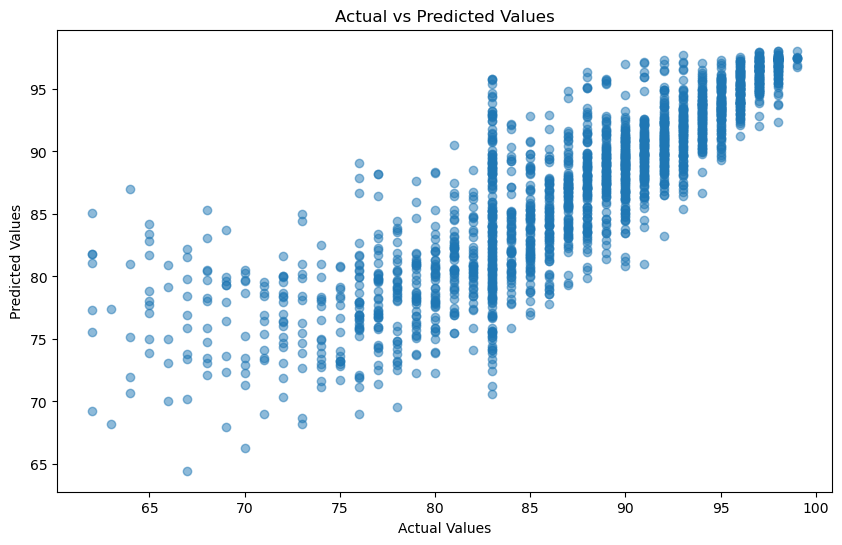

In [254]:
# Plot the predictions vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

### Insights
This scatter plot shows the relationship between actual values and predicted values from a regression model. Analyzing this plot can provide insights into the performance of the model. Here are some key points:
- Positive Correlation:
The plot shows a generally positive correlation between actual and predicted values, indicating that as the actual values increase, the predicted values also tend to increase. This is a good sign that the model is capturing the general trend in the data.

#### Key Insights
- Accuracy and Linearity:
    A perfect prediction would result in all points lying on the 45-degree line where predicted values equal actual values. The scatter plot shows that while many points are close to this line, there is some spread, indicating prediction errors. The spread around the line suggests that the model has some degree of error, but the overall alignment with the 45-degree line suggests reasonable performance.

- Bias: The plot shows that for lower actual values (below 75), the model tends to over-predict, as predicted values are generally higher than actual values. For higher actual values (above 85), the model generally under-predicts, as predicted values are lower than actual values. This indicates a potential bias in the model, where it tends to predict values closer to the mean rather than the extremes.

- Variance: The variance in predictions appears to be higher for mid-range actual values (around 80 to 85), as indicated by the wider spread of points. This suggests that the model is less consistent in this range.
    
- Outliers:
There are a few points that deviate significantly from the general trend. These outliers could be due to various factors such as noise in the data, errors in the model, or special cases that the model fails to capture.

#### Implications
- Model Improvement:
The model might benefit from further tuning to reduce bias and variance. Techniques such as regularization, ensembling, or feature engineering could help improve performance.

- Error Analysis:
Conducting a more detailed error analysis to understand why certain predictions are off can provide insights into potential improvements. Identifying patterns in the residuals (differences between actual and predicted values) can help diagnose issues with the model.

- Validation:
Further validation using different datasets or cross-validation techniques can provide a more comprehensive assessment of the model's performance.

Overall, the scatter plot provides valuable insights into the performance of the regression model, highlighting areas where the model performs well and areas where there is room for improvement.

In [255]:
# Using Statsmodels Perform checks for significant variables using the appropriate method

import statsmodels.api as sm

X_train_sm = sm.add_constant(X_train)
X_test_sm = sm.add_constant(X_test)

model_sm = sm.OLS(y_train, X_train_sm).fit()

print(model_sm.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.747
Model:                            OLS   Adj. R-squared:                  0.746
Method:                 Least Squares   F-statistic:                     786.3
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:34:53   Log-Likelihood:                -17255.
No. Observations:                6144   AIC:                         3.456e+04
Df Residuals:                    6120   BIC:                         3.472e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     99

In [256]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])],
    index=X_train_sm.columns,
)

print("VIF values: \n\n{}\n".format(vif_series1.apply(lambda x: "{:.5f}".format(x))))

VIF values: 

const                                54.82632
lread                                     inf
lwrite                                    inf
scall                                 2.40349
sread                                 3.57516
swrite                                3.33773
fork                                  2.40396
exec                                  1.94643
rchar                      732471273866.87744
wchar                       98285731095.02081
pgout                                 4.00538
ppgout                               10.03682
pgfree                               14.27698
pgscan                                4.76870
atch                                  1.51888
pgin                                  4.22526
ppgin                                 4.14457
pflt                              28799.53712
vflt                              71110.09419
freemem                               1.68737
freeswap                              1.91978
total_reads_writes  

A few predictor VIF > 5 therefore there is some multicolinearity in the data. So We remove those predictors with multicolinarity due to which there is least impact on the adjusted R2.
 
 From Above we can see that VIf for "total_reads_writes", "lread" & 'lwrite' are Infinity.
so Lets check them first

In [257]:
#1) Removing predictor 'total_reads_writes' 
X_train2 = X_train_sm.drop(["total_reads_writes"], axis=1)
olsmod_1 = sm.OLS(y_train, X_train2)
olsres_1 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_1.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_1.rsquared_adj, 3),
)

R-squared: 0.747 
Adjusted R-squared: 0.746


In [258]:
#2) Removing predictor 'lread' 
X_train3 = X_train_sm.drop(["lread"], axis=1)
olsmod_2 = sm.OLS(y_train, X_train3)
olsres_2 = olsmod_2.fit()
print(
    "R-squared:",
    np.round(olsres_2.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_2.rsquared_adj, 3),
)

R-squared: 0.747 
Adjusted R-squared: 0.746


In [259]:
#3) Removing predictor 'lwrite' 
X_train4 = X_train_sm.drop(["lwrite"], axis=1)
olsmod_3 = sm.OLS(y_train, X_train4)
olsres_3 = olsmod_3.fit()
print(
    "R-squared:",
    np.round(olsres_3.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_3.rsquared_adj, 3),
)

R-squared: 0.747 
Adjusted R-squared: 0.746


In [260]:
# From the above we can see there was no changes in RSquare Value, From the Three Predicator we Decide to remove the "total_reads_writes"
X_train_sm = X_train_sm.drop(["total_reads_writes"], axis=1)

olsmod_4 = sm.OLS(y_train, X_train_sm)
olsres_4 = olsmod_4.fit()
print(olsres_4.summary())


                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.747
Model:                            OLS   Adj. R-squared:                  0.746
Method:                 Least Squares   F-statistic:                     786.3
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:34:54   Log-Likelihood:                -17255.
No. Observations:                6144   AIC:                         3.456e+04
Df Residuals:                    6120   BIC:                         3.472e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     99

In [261]:
# Checking VIF Again

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])],
    index=X_train_sm.columns,
)

print("VIF values: \n\n{}\n".format(vif_series1.apply(lambda x: "{:.5f}".format(x))))

VIF values: 

const                                54.82632
lread                                 2.62789
lwrite                                2.27383
scall                                 2.40349
sread                                 3.57516
swrite                                3.33773
fork                                  2.40396
exec                                  1.94643
rchar                      732471273866.87744
wchar                       98285731095.02081
pgout                                 4.00538
ppgout                               10.03682
pgfree                               14.27698
pgscan                                4.76870
atch                                  1.51888
pgin                                  4.22526
ppgin                                 4.14457
pflt                              28799.53712
vflt                              71110.09419
freemem                               1.68737
freeswap                              1.91978
total_char_transferr

In [262]:
# From Above we can see that VIf for "total_char_transferred", "rchar" & 'wchar' are Very high. So Lets check them first

#1) Removing predictor 'total_char_transferred' 
X_train5 = X_train_sm.drop(["total_char_transferred"], axis=1)
olsmod_5 = sm.OLS(y_train, X_train5)
olsres_5 = olsmod_5.fit()
print(
    "R-squared:",
    np.round(olsres_5.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_5.rsquared_adj, 3),
)

R-squared: 0.745 
Adjusted R-squared: 0.744


In [263]:
#2) Removing predictor 'rchar' 
X_train6 = X_train_sm.drop(["rchar"], axis=1)
olsmod_6 = sm.OLS(y_train, X_train6)
olsres_6 = olsmod_6.fit()
print(
    "R-squared:",
    np.round(olsres_6.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_6.rsquared_adj, 3),
)

R-squared: 0.745 
Adjusted R-squared: 0.744


In [264]:
#3) Removing predictor 'rwrite' 
X_train7 = X_train_sm.drop(["wchar"], axis=1)
olsmod_7 = sm.OLS(y_train, X_train7)
olsres_7 = olsmod_7.fit()
print(
    "R-squared:",
    np.round(olsres_7.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_7.rsquared_adj, 3),
)

R-squared: 0.745 
Adjusted R-squared: 0.744


In [265]:
# From the above we can see there was no changes in RSquare Value, From the Three Predicator we Decide to remove the "total_char_transferred"
X_train_sm = X_train_sm.drop(["total_char_transferred"], axis=1)

olsmod_8 = sm.OLS(y_train, X_train_sm)
olsres_8 = olsmod_8.fit()
print(olsres_8.summary())


                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.745
Model:                            OLS   Adj. R-squared:                  0.744
Method:                 Least Squares   F-statistic:                     813.0
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:34:55   Log-Likelihood:                -17280.
No. Observations:                6144   AIC:                         3.461e+04
Df Residuals:                    6121   BIC:                         3.476e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   99.2636 

In [266]:
# Checking VIF Again

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])],
    index=X_train_sm.columns,
)

print("VIF values: \n\n{}\n".format(vif_series1.apply(lambda x: "{:.5f}".format(x))))

VIF values: 

const                       54.81389
lread                        2.62678
lwrite                       2.26874
scall                        2.40155
sread                        3.51366
swrite                       3.32954
fork                         2.40377
exec                         1.94560
rchar                        1.64745
wchar                        1.38009
pgout                        4.00318
ppgout                      10.03262
pgfree                      14.27140
pgscan                       4.76854
atch                         1.51861
pgin                         4.22015
ppgin                        4.14274
pflt                     28796.32213
vflt                     71101.86512
freemem                      1.68614
freeswap                     1.91892
total_page_faults       174986.99850
runqsz_Not_CPU_Bound         1.21631
dtype: object



In [267]:
# From Above we can see that VIf for "total_page_faults", "pflt" & 'vflt' are Very high. So Lets check them first

#1) Removing predictor 'total_page_faults' 
X_train8 = X_train_sm.drop(["total_page_faults"], axis=1)
olsmod_9 = sm.OLS(y_train, X_train8)
olsres_9 = olsmod_9.fit()
print(
    "R-squared:",
    np.round(olsres_9.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_9.rsquared_adj, 3),
)

R-squared: 0.744 
Adjusted R-squared: 0.743


In [268]:
#2) Removing predictor 'pflt' 
X_train9 = X_train_sm.drop(["pflt"], axis=1)
olsmod_10 = sm.OLS(y_train, X_train9)
olsres_10 = olsmod_10.fit()
print(
    "R-squared:",
    np.round(olsres_10.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_10.rsquared_adj, 3),
)

R-squared: 0.744 
Adjusted R-squared: 0.743


In [269]:
#3) Removing predictor 'vflt' 
X_train10 = X_train_sm.drop(["vflt"], axis=1)
olsmod_11 = sm.OLS(y_train, X_train10)
olsres_11 = olsmod_11.fit()
print(
    "R-squared:",
    np.round(olsres_11.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_11.rsquared_adj, 3),
)

R-squared: 0.744 
Adjusted R-squared: 0.743


In [270]:
# From the above we can see there was no changes in RSquare Value, From the Three Predicator we Decide to remove the "total_page_faults"
X_train_sm = X_train_sm.drop(["total_page_faults"], axis=1)

olsmod_12 = sm.OLS(y_train, X_train_sm)
olsres_12 = olsmod_12.fit()
print(olsres_12.summary())


                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.744
Model:                            OLS   Adj. R-squared:                  0.743
Method:                 Least Squares   F-statistic:                     846.5
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:34:56   Log-Likelihood:                -17295.
No. Observations:                6144   AIC:                         3.463e+04
Df Residuals:                    6122   BIC:                         3.478e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   99.0896 

In [271]:
# Checking VIF Again

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])],
    index=X_train_sm.columns,
)

print("VIF values: \n\n{}\n".format(vif_series1.apply(lambda x: "{:.5f}".format(x))))

VIF values: 

const                   54.41551
lread                    2.62511
lwrite                   2.26804
scall                    2.39948
sread                    3.51245
swrite                   3.32851
fork                     2.40373
exec                     1.93809
rchar                    1.64718
wchar                    1.37960
pgout                    4.00258
ppgout                  10.03257
pgfree                  14.26610
pgscan                   4.76804
atch                     1.51762
pgin                     4.21898
ppgin                    4.14157
pflt                     3.83035
vflt                     4.20048
freemem                  1.68537
freeswap                 1.91437
runqsz_Not_CPU_Bound     1.21181
dtype: object



In [272]:
# From Above we can see that VIf for "pgfree" & 'ppgout' are Very high. So Lets check them first

#1) Removing predictor 'ppgout' 
X_train11 = X_train_sm.drop(["ppgout"], axis=1)
olsmod_13 = sm.OLS(y_train, X_train11)
olsres_13 = olsmod_13.fit()
print(
    "R-squared:",
    np.round(olsres_13.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_13.rsquared_adj, 3),
)

R-squared: 0.744 
Adjusted R-squared: 0.743


In [273]:
#2) Removing predictor 'pgfree' 
X_train12 = X_train_sm.drop(["pgfree"], axis=1)
olsmod_14 = sm.OLS(y_train, X_train12)
olsres_14 = olsmod_14.fit()
print(
    "R-squared:",
    np.round(olsres_14.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_14.rsquared_adj, 3),
)

R-squared: 0.743 
Adjusted R-squared: 0.742


In [274]:
# From the above we can see there was no changes in RSquare Value, From the Three Predicator we Decide to remove the "pgfree" as "ppgout seems to be more specific to the number of pages that are actually paged out." while "pgfree" is all bout free memory

X_train_sm = X_train_sm.drop(["pgfree"], axis=1)

olsmod_15 = sm.OLS(y_train, X_train_sm)
olsres_15 = olsmod_15.fit()
print(olsres_12.summary())


                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.744
Model:                            OLS   Adj. R-squared:                  0.743
Method:                 Least Squares   F-statistic:                     846.5
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:34:59   Log-Likelihood:                -17295.
No. Observations:                6144   AIC:                         3.463e+04
Df Residuals:                    6122   BIC:                         3.478e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   99.0896 

In [275]:
# Checking VIF Again

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])],
    index=X_train_sm.columns,
)

print("VIF values: \n\n{}\n".format(vif_series1.apply(lambda x: "{:.5f}".format(x))))

VIF values: 

const                   54.33205
lread                    2.62462
lwrite                   2.26796
scall                    2.39767
sread                    3.51236
swrite                   3.32840
fork                     2.40348
exec                     1.93803
rchar                    1.64643
wchar                    1.37047
pgout                    3.99881
ppgout                   5.51371
pgscan                   2.25371
atch                     1.50602
pgin                     4.21730
ppgin                    4.13863
pflt                     3.82925
vflt                     4.19974
freemem                  1.67906
freeswap                 1.91184
runqsz_Not_CPU_Bound     1.21070
dtype: object



In [276]:
# We Still VIf value for ppgout more then 5, so we are going to drop that too

X_train_sm = X_train_sm.drop(["ppgout"], axis=1)

olsmod_16 = sm.OLS(y_train, X_train_sm)
olsres_16 = olsmod_16.fit()
print(olsres_16.summary())


                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.743
Model:                            OLS   Adj. R-squared:                  0.742
Method:                 Least Squares   F-statistic:                     930.4
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:34:59   Log-Likelihood:                -17308.
No. Observations:                6144   AIC:                         3.466e+04
Df Residuals:                    6124   BIC:                         3.479e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   99.1177 

In [277]:
# Checking VIF Again

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])],
    index=X_train_sm.columns,
)

print("VIF values: \n\n{}\n".format(vif_series1.apply(lambda x: "{:.5f}".format(x))))

VIF values: 

const                   54.30035
lread                    2.62320
lwrite                   2.26721
scall                    2.39467
sread                    3.51201
swrite                   3.32836
fork                     2.40280
exec                     1.93802
rchar                    1.64626
wchar                    1.36773
pgout                    1.96581
pgscan                   1.80574
atch                     1.45977
pgin                     4.21652
ppgin                    4.13861
pflt                     3.82615
vflt                     4.19749
freemem                  1.66520
freeswap                 1.91178
runqsz_Not_CPU_Bound     1.21049
dtype: object



In [278]:
# Removing predictor 'pgfree' 
X_train13 = X_train_sm.drop(["ppgin"], axis=1)
olsmod_17 = sm.OLS(y_train, X_train13)
olsres_17 = olsmod_17.fit()
print(
    "R-squared:",
    np.round(olsres_17.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_17.rsquared_adj, 3),
)

R-squared: 0.742 
Adjusted R-squared: 0.741


In [279]:
X_train_sm = X_train_sm.drop(["ppgin"], axis=1)

olsmod_18 = sm.OLS(y_train, X_train_sm)
olsres_18 = olsmod_18.fit()
print(olsres_18.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.742
Model:                            OLS   Adj. R-squared:                  0.741
Method:                 Least Squares   F-statistic:                     979.4
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:35:00   Log-Likelihood:                -17315.
No. Observations:                6144   AIC:                         3.467e+04
Df Residuals:                    6125   BIC:                         3.480e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   99.0808 

In [280]:
# Checking VIF Again

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])],
    index=X_train_sm.columns,
)

print("VIF values: \n\n{}\n".format(vif_series1.apply(lambda x: "{:.5f}".format(x))))

VIF values: 

const                   54.26285
lread                    2.62313
lwrite                   2.26573
scall                    2.39433
sread                    3.50903
swrite                   3.32512
fork                     2.40227
exec                     1.93754
rchar                    1.63116
wchar                    1.36763
pgout                    1.96557
pgscan                   1.80167
atch                     1.45732
pgin                     1.44935
pflt                     3.82557
vflt                     4.19629
freemem                  1.66412
freeswap                 1.91081
runqsz_Not_CPU_Bound     1.20900
dtype: object



In [281]:
#Still there few variable with high VIf value.Check for vflt.
# Removing predictor 'pgfree' 
X_train14 = X_train_sm.drop(["vflt"], axis=1)
olsmod_19 = sm.OLS(y_train, X_train14)
olsres_19 = olsmod_19.fit()
print(
    "R-squared:",
    np.round(olsres_19.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_19.rsquared_adj, 3),
)


R-squared: 0.737 
Adjusted R-squared: 0.736


In [282]:
# Decide to drop vflt and there is very less impact
X_train_sm = X_train_sm.drop(["vflt"], axis=1)

olsmod_20 = sm.OLS(y_train, X_train_sm)
olsres_20 = olsmod_20.fit()
print(olsres_20.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.737
Model:                            OLS   Adj. R-squared:                  0.736
Method:                 Least Squares   F-statistic:                     1009.
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:35:00   Log-Likelihood:                -17378.
No. Observations:                6144   AIC:                         3.479e+04
Df Residuals:                    6126   BIC:                         3.491e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   98.6633 

In [283]:
# Checking VIF Again

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])],
    index=X_train_sm.columns,
)

print("VIF values: \n\n{}\n".format(vif_series1.apply(lambda x: "{:.5f}".format(x))))

VIF values: 

const                   53.75420
lread                    2.62091
lwrite                   2.26573
scall                    2.39422
sread                    3.48859
swrite                   3.31784
fork                     2.28237
exec                     1.91124
rchar                    1.62163
wchar                    1.35999
pgout                    1.96556
pgscan                   1.79842
atch                     1.45730
pgin                     1.42350
pflt                     2.53495
freemem                  1.66391
freeswap                 1.89260
runqsz_Not_CPU_Bound     1.20803
dtype: object



In [284]:
#Still there few variable with high VIf value.Check for sread.
# Removing predictor 'pgfree' 
X_train15 = X_train_sm.drop(["sread"], axis=1)
olsmod_21 = sm.OLS(y_train, X_train15)
olsres_21 = olsmod_21.fit()
print(
    "R-squared:",
    np.round(olsres_21.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_21.rsquared_adj, 3),
)


R-squared: 0.733 
Adjusted R-squared: 0.733


In [285]:
# Decide to drop read and there is very less impact
X_train_sm = X_train_sm.drop(["sread"], axis=1)

olsmod_22 = sm.OLS(y_train, X_train_sm)
olsres_22 = olsmod_22.fit()
print(olsres_22.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.733
Model:                            OLS   Adj. R-squared:                  0.733
Method:                 Least Squares   F-statistic:                     1053.
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:35:01   Log-Likelihood:                -17418.
No. Observations:                6144   AIC:                         3.487e+04
Df Residuals:                    6127   BIC:                         3.498e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   98.4700 

In [286]:
# Checking VIF Again

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])],
    index=X_train_sm.columns,
)

print("VIF values: \n\n{}\n".format(vif_series1.apply(lambda x: "{:.5f}".format(x))))

VIF values: 

const                   53.58174
lread                    2.62091
lwrite                   2.26531
scall                    2.25371
swrite                   2.22694
fork                     2.27876
exec                     1.90857
rchar                    1.47575
wchar                    1.35738
pgout                    1.96523
pgscan                   1.79842
atch                     1.45643
pgin                     1.42350
pflt                     2.52990
freemem                  1.66375
freeswap                 1.88646
runqsz_Not_CPU_Bound     1.20613
dtype: object



#### Now that we do not have multicollinearity in our data, the p-values of the coefficients have become reliable. We can remove the non-significant predictor variables (p-Value > 0.05).

In [287]:
print(olsres_22.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.733
Model:                            OLS   Adj. R-squared:                  0.733
Method:                 Least Squares   F-statistic:                     1053.
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:35:05   Log-Likelihood:                -17418.
No. Observations:                6144   AIC:                         3.487e+04
Df Residuals:                    6127   BIC:                         3.498e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   98.4700 

In [288]:
# From above summary we can see that wchar, atch, freeswap & runqsz_Not_CPU_Bound. So We will start droping the 'freeswap' as it has high p-value

X_train_sm = X_train_sm.drop(["freeswap"], axis=1)

olsmod_23 = sm.OLS(y_train, X_train_sm)
olsres_23 = olsmod_23.fit()
print(olsres_23.summary())


                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.733
Model:                            OLS   Adj. R-squared:                  0.733
Method:                 Least Squares   F-statistic:                     1124.
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:35:05   Log-Likelihood:                -17418.
No. Observations:                6144   AIC:                         3.487e+04
Df Residuals:                    6128   BIC:                         3.498e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   98.4822 

In [289]:
# We will drop wchar next as it has hight p-value now
X_train_sm = X_train_sm.drop(["wchar"], axis=1)

olsmod_24 = sm.OLS(y_train, X_train_sm)
olsres_24 = olsmod_24.fit()
print(olsres_24.summary())


                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.733
Model:                            OLS   Adj. R-squared:                  0.733
Method:                 Least Squares   F-statistic:                     1204.
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:35:06   Log-Likelihood:                -17418.
No. Observations:                6144   AIC:                         3.487e+04
Df Residuals:                    6129   BIC:                         3.497e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   98.4898 

In [290]:
# We will drop atch next as it has hight p-value now
X_train_sm = X_train_sm.drop(["atch"], axis=1)

olsmod_25 = sm.OLS(y_train, X_train_sm)
olsres_25 = olsmod_25.fit()
print(olsres_25.summary())


                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.733
Model:                            OLS   Adj. R-squared:                  0.733
Method:                 Least Squares   F-statistic:                     1297.
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:35:19   Log-Likelihood:                -17418.
No. Observations:                6144   AIC:                         3.486e+04
Df Residuals:                    6130   BIC:                         3.496e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   98.4910 

In [291]:
# We will drop runqsz_Not_CPU_Bound next as it has hight p-value now
X_train_sm = X_train_sm.drop(["runqsz_Not_CPU_Bound"], axis=1)

olsmod_26 = sm.OLS(y_train, X_train_sm)
olsres_26 = olsmod_26.fit()
print(olsres_26.summary())


                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.733
Model:                            OLS   Adj. R-squared:                  0.733
Method:                 Least Squares   F-statistic:                     1405.
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:35:56   Log-Likelihood:                -17418.
No. Observations:                6144   AIC:                         3.486e+04
Df Residuals:                    6131   BIC:                         3.495e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         98.4314      0.148    667.213      0.0

#### After dropping the features causing strong multicollinearity and the statistically insignificant ones, our model performance hasn't dropped much . This shows that these variables did not have much predictive power

### Insight from above summary 

#### R-squared: 
- The R-squared value remains high at 0.733, indicating that the model still explains a significant portion of the variation in the dependent variable.
#### F-statistic: 
- The F-statistic remains high at 1405, indicating that the model is statistically significant.
##### P-values: 
- All p-values are below the 0.05 significance level, indicating that all variables in the model are statistically significant.

### Testing the Assumptions of Linear Regression
- For Linear Regression, we need to check if the following assumptions hold:-
    - Linearity
    - Independence
    - Homoscedasticity
    - Normality of error terms
    - No strong Multicollinearity
    
#### Linearity and Independence of predictors 

In [292]:
df_pred = pd.DataFrame()

df_pred["Actual Values"] = y_train.values.flatten()  # actual values
df_pred["Fitted Values"] = olsres_26.fittedvalues.values  # predicted values
df_pred["Residuals"] = olsres_26.resid.values  # residuals

df_pred.head()

,Actual Values,Fitted Values,Residuals
0,94,92.039053,1.960947
1,96,95.266963,0.733037
2,77,82.494067,-5.494067
3,93,93.333457,-0.333457
4,86,83.566538,2.433462


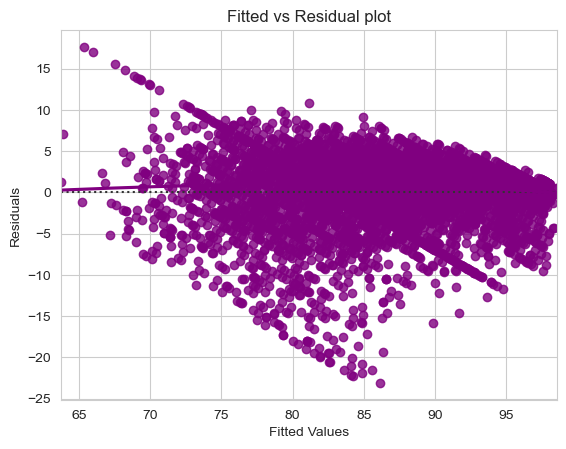

In [293]:
# let us plot the fitted values vs residuals
sns.set_style("whitegrid")
sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

#### No pattern in the data thus the assumption of linearity and independence of predictors satisfied 

#### Test for Normality 

In [294]:
stats.shapiro(df_pred["Residuals"])

ShapiroResult(statistic=0.9090408086776733, pvalue=0.0)

#### Since p-value < 0.05, the residuals are not normal as per shapiro test.

#### Test for Homoscedasticity

In [295]:
import statsmodels.stats.api as sms
sms.het_goldfeldquandt(df_pred["Residuals"], X_train_sm)[1]

0.7969925454967073

#### Since p-value > 0.05 we can say that the residuals are homoscedastic.

#### The model built olsres_26 satisfies all assumptions of Linear Regression

In [299]:
olsres_26.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.733
Model:                            OLS   Adj. R-squared:                  0.733
Method:                 Least Squares   F-statistic:                     1405.
Date:                Thu, 20 Jun 2024   Prob (F-statistic):               0.00
Time:                        18:16:43   Log-Likelihood:                -17418.
No. Observations:                6144   AIC:                         3.486e+04
Df Residuals:                    6131   BIC:                         3.495e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         98.4314      0.148    667.213      0.000      98.142      98.721
lread         -0.0810      0.008    -10.527      0.000      -0.096      -0.066
lwrite         0.0506      0.013      3.829      0.000       0.025       0.077
scall         -0.0016   5.04e-05    -31.992      0.000      -0.002      -0.002
swrite        -0.0089      0.001     -9.109      0.000      -0.011      -0.007
fork           0.2911      0.078      3.750      0.000       0.139       0.443
exec          -0.4588      0.052     -8.908      0.000      -0.560      -0.358
rchar      -7.479e-06   4.42e-07    -16.927      0.000   -8.35e-06   -6.61e-06
pgout         -0.2395      0.052     -4.564      0.000      -0.342      -0.137
pgscan        -0.0466      0.008     -5.662      0.000      -0.063      -0.030
pgin          -0.1546      0.012    -13.441      0.000      -0.177      -0.132
pflt          -0.0362      0.001    -36.389      0.000      -0.038      -0.034
freemem        0.0002   6.62e-05      3.448      0.001    9.85e-05       0.000
==============================================================================
Omnibus:                     1631.511   Durbin-Watson:                   1.991
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5513.469
Skew:                          -1.323   Prob(JB):                         0.00
Kurtosis:                       6.813   Cond. No.                     5.86e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.86e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### Predictions

In [304]:
X_train_sm.columns

Index(['const', 'lread', 'lwrite', 'scall', 'swrite', 'fork', 'exec', 'rchar',
       'pgout', 'pgscan', 'pgin', 'pflt', 'freemem'],
      dtype='object')

In [305]:
X_test_sm.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec',
       'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin',
       'ppgin', 'pflt', 'vflt', 'freemem', 'freeswap', 'total_reads_writes',
       'total_char_transferred', 'total_page_faults', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [308]:
X_test_1 = X_test_sm.drop(['sread', 'wchar', 'ppgout', 'pgfree', 'atch', 'ppgin', 'vflt', 'freeswap','total_reads_writes',
       'total_char_transferred', 'total_page_faults', 'runqsz_Not_CPU_Bound' ], axis=1)

In [309]:
X_test_1.columns

Index(['const', 'lread', 'lwrite', 'scall', 'swrite', 'fork', 'exec', 'rchar',
       'pgout', 'pgscan', 'pgin', 'pflt', 'freemem'],
      dtype='object')

In [311]:
# let's make predictions on the test set
y_pred_test = olsres_26.predict(X_test_1)
y_pred_train = olsres_26.predict(X_train_sm)

In [312]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [313]:
# let's check the RMSE on the train data
rmse1 = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse1

4.1207868695760945

In [314]:
# let's check the RMSE on the test data
rmse2 = np.sqrt(mean_squared_error(y_test, y_pred_test))
rmse2

4.07444503966517

#### Creating Multiple Models and Evaluate

In [302]:
from sklearn.linear_model import Ridge, Lasso

# Initialize models
ridge_model = Ridge(alpha=1.0)
lasso_model = Lasso(alpha=0.1)

# Train models
ridge_model.fit(X_train, y_train)
lasso_model.fit(X_train, y_train)

# Make predictions
y_pred_ridge = ridge_model.predict(X_test)
y_pred_lasso = lasso_model.predict(X_test)

# Evaluate Ridge model
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)
rmse_ridge = np.sqrt(mse_ridge)

print(f'Ridge Model - Mean Squared Error: {mse_ridge}')
print(f'Ridge Model - Root Mean Squared Error: {rmse_ridge}')
print(f'Ridge Model - R^2 Score: {r2_ridge}')

# Evaluate Lasso model
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)
rmse_lasso = np.sqrt(mse_lasso)

print(f'Lasso Model - Mean Squared Error: {mse_lasso}')
print(f'Lasso Model - Root Mean Squared Error: {rmse_lasso}')
print(f'Lasso Model - R^2 Score: {r2_lasso}')

Ridge Model - Mean Squared Error: 15.921242830946197
Ridge Model - Root Mean Squared Error: 3.9901432093279805
Ridge Model - R^2 Score: 0.7235705972214677
Lasso Model - Mean Squared Error: 16.163813082274423
Lasso Model - Root Mean Squared Error: 4.0204244903087565
Lasso Model - R^2 Score: 0.7193590196192363


## Problem 1 - Business Insights & Recommendations
- ### Comment on the Linear Regression equation from the final model and impact of relevant variables (atleast 2) as per the equation
- ### Conclude with the key takeaways (actionable insights and recommendations) for the business

In [316]:
# Writing Model Equation

Equation = "usr ="
print(Equation, end=" ")
for i in range(len(X_train_sm.columns)):
    if i == 0:
        print(olsres_26.params[i], "+", end=" ")
    elif i != len(X_train_sm.columns) - 1:
        print(
            olsres_26.params[i],
            "* (",
            X_train_sm.columns[i],
            ")",
            "+",
            end="  ",
        )
    else:
        print(olsres_26.params[i], "* (", X_train_sm.columns[i], ")")

usr = 98.43144987636954 + -0.08102029433914065 * ( lread ) +  0.050602638437615366 * ( lwrite ) +  -0.001612059404412203 * ( scall ) +  -0.00887608566641272 * ( swrite ) +  0.291132984369165 * ( fork ) +  -0.4588275777138781 * ( exec ) +  -7.479133181490279e-06 * ( rchar ) +  -0.23947322253190773 * ( pgout ) +  -0.046576205725542524 * ( pgscan ) +  -0.15457470899017925 * ( pgin ) +  -0.03620043358461722 * ( pflt ) +  0.0002283688923334947 * ( freemem )


### Insights

- lread: Negative coefficient (-0.08102029433914065) suggests that an increase in lread (reads between system and user memory) will decrease the usr value.
- lwrite: Positive coefficient (0.050602638437615366) suggests that an increase in lwrite (writes between system and user memory) will increase the usr value.
- scall: Negative coefficient (-0.001612059404412203) suggests that an increase in scall (system calls) will decrease the usr value.
- swrite: Negative coefficient (-0.00887608566641272) suggests that an increase in swrite (system write calls) will decrease the usr value.
- fork: Positive coefficient (0.291132984369165) suggests that an increase in fork (system fork calls) will increase the usr value.
- exec: Negative coefficient (-0.4588275777138781) suggests that an increase in exec (system exec calls) will decrease the usr value.
- rchar: Negative coefficient (-7.479133181490279e-06) suggests that an increase in rchar (characters transferred by system read calls) will decrease the usr value.
- pgout: Negative coefficient (-0.23947322253190773) suggests that an increase in pgout (page out requests) will decrease the usr value.
- pgscan: Negative coefficient (-0.046576205725542524) suggests that an increase in pgscan (pages checked for freeing) will decrease the usr value.
- pgin: Negative coefficient (-0.15457470899017925) suggests that an increase in pgin (page-in requests) will decrease the usr value.
- pflt: Negative coefficient (-0.03620043358461722) suggests that an increase in pflt (page faults caused by protection errors) will decrease the usr value.
- freemem: Positive coefficient (0.0002283688923334947) suggests that an increase in freemem (free memory pages) will increase the usr value.


### Business Insights:

#### Optimization of Memory Read/Write Operations:
- Decrease in lread is associated with an increase in usr. This suggests that reducing the number of reads between system memory and user memory can free up CPU time for user processes.
- Increase in lwrite positively affects usr, indicating that optimizing write operations might improve CPU efficiency in user mode.

#### System Calls and Fork Operations:
- A decrease in system calls (scall) is associated with an increase in usr. Streamlining and reducing unnecessary system calls can improve CPU efficiency.
- Increasing fork operations positively impacts usr. Optimizing processes that require forking might enhance CPU performance in user mode.

#### Page Faults and Memory Management:
- Decrease in pgout and pgin is associated with better CPU performance in user mode. Efficient memory management that reduces paging activities can lead to better CPU utilization.
- Increase in available memory (freemem) has a positive, though minor, impact on usr. Ensuring sufficient free memory can help maintain better CPU performance in user mode.

#### System Exec Calls:
- A decrease in exec calls correlates with better CPU performance in user mode. Optimizing the execution of programs and reducing the frequency of exec calls can improve CPU efficiency.

### Recommendations:

#### Memory Operation Optimization:
- Reduce Read Operations: Implement caching mechanisms or optimize memory access patterns to reduce the frequency of read operations.
- Optimize Write Operations: Ensure that write operations are efficient and minimize delays, possibly through improved buffering or batching strategies.

#### System Call Reduction:
- Streamline System Calls: Audit and optimize system calls to remove unnecessary operations. This can involve code reviews and optimizing system-level interactions.
- Optimize Fork Operations: Ensure that processes that require forking are optimized, and use efficient process management techniques.

#### Efficient Memory Management:
- Reduce Paging: Implement better memory management strategies to reduce paging activities. This can involve optimizing application memory usage and ensuring adequate physical memory is available.
- Increase Free Memory: Ensure that there is sufficient free memory to avoid excessive paging and to maintain efficient CPU performance.

#### Execution Optimization:
- Minimize Exec Calls: Reduce the frequency of exec calls by optimizing application workflows and ensuring efficient execution paths.
- By implementing these recommendations, the business can improve CPU efficiency in user mode, leading to better overall system performance and potentially reduced operational costs.

# Problem - 2

#### Objective
In your role as a statistician at the Republic of Indonesia Ministry of Health, you have been entrusted with a dataset containing information from a Contraceptive Prevalence Survey. This dataset encompasses data from 1473 married females who were either not pregnant or were uncertain of their pregnancy status during the survey.

Your task involves predicting whether these women opt for a contraceptive method of choice. This prediction will be based on a comprehensive analysis of their demographic and socio-economic attributes.

## Problem 2 - Define the problem and perform exploratory Data Analysis

### Problem definition

Predicting Contraceptive Method Choice among Married Women in Indonesia based on Demographic and Socio-economic Factors

In [1]:
#Libaries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

#load Dataset
data = pd.read_excel("Contraceptive_method_dataset.xlsx")
data.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


### Check shape, Data types, statistical summary

In [2]:
data.shape

(1473, 10)

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [4]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1402.0,32.606277,8.274927,16.0,26.0,32.0,39.0,49.0
No_of_children_born,1452.0,3.254132,2.365212,0.0,1.0,3.0,4.0,16.0
Husband_Occupation,1473.0,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0


#### Key Insights from the Data

- The dataset has 1473 rows and 10 columns.

- The dataset has 7 categorical variable and 3 numerical variable.

- The dataset has 2 float type variable, 1 int type variable, 7 object type variable.

- Missing Values: The data has some missing values, particularly in the "Wife_age" and "No_of_children_born" columns, which have 1402 and 1452 non-null values, respectively. This may need to be addressed during data preprocessing.

#### Observations:
- Demographic Characteristics:
    The average age of the women in the dataset is 32.6 years, with a standard deviation of 8.3 years.
    The average number of children ever born is 3.25, with a standard deviation of 2.37.
    The husband's occupation is categorized into 4 levels, with the majority of husbands falling into the middle categories (2 and 3).
- Socio-economic Factors:
    The wife's and husband's education levels are categorical variables with 4 levels each, ranging from "uneducated" to "tertiary".
    The standard of living index is also a categorical variable with 4 levels, ranging from "very low" to "high".
    The media exposure variable is a binary variable, indicating whether the wife has "Good" or "Not good" media exposure.
- Target Variable:
    The contraceptive method used by the women is the target variable, which is a categorical variable with two values: "No" and "Yes".
    The distribution of the target variable is not provided in the data summary, so it's unclear if the dataset is balanced or if there is a significant imbalance between the two classes.

### Univariate analysis

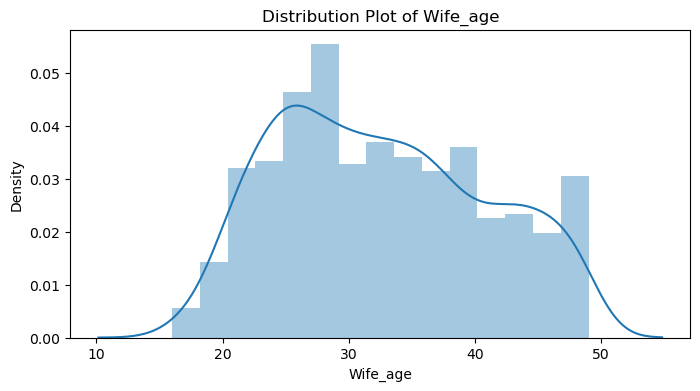

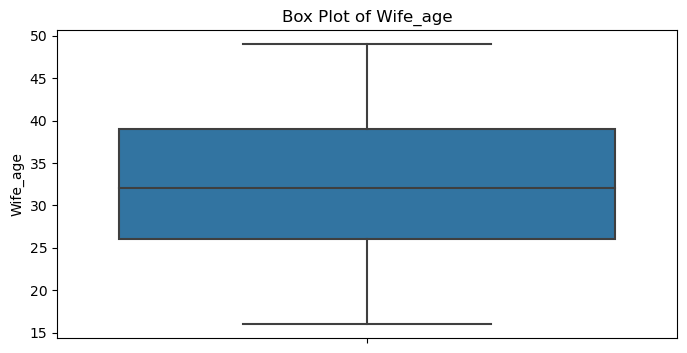

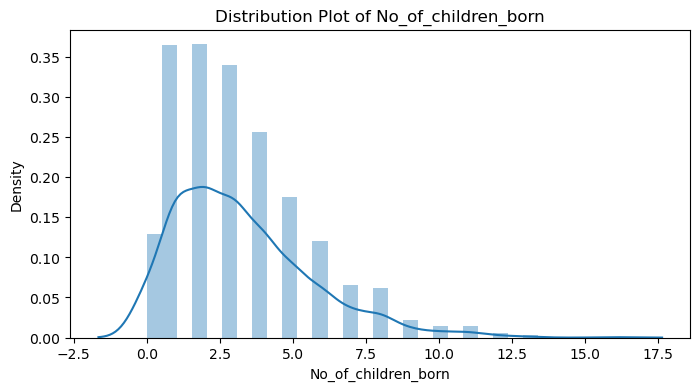

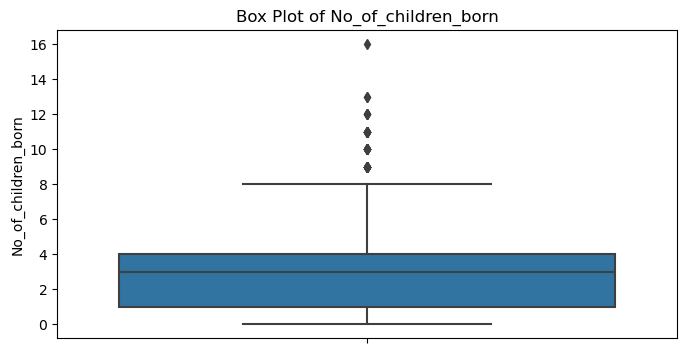

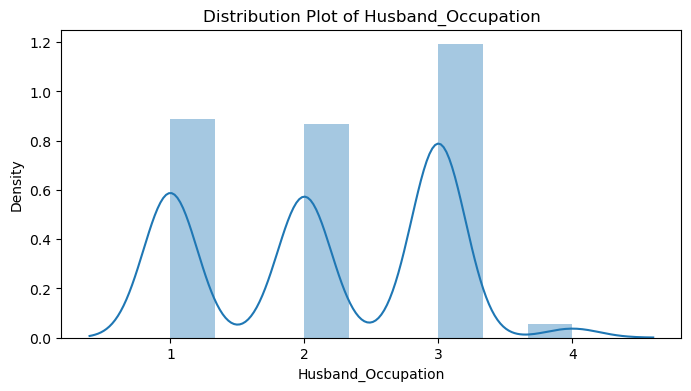

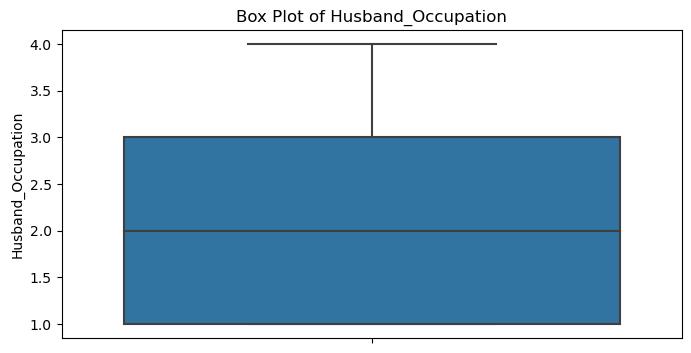

In [5]:
# Numerical columns
numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns

# Univariate analysis for numerical columns
for col in numeric_cols:
  # Distribution plot
  plt.figure(figsize=(8, 4))
  sns.distplot(data[col])
  plt.title(f'Distribution Plot of {col}')
  plt.show()

  # Box plot
  plt.figure(figsize=(8, 4))
  sns.boxplot(y=data[col])
  plt.title(f'Box Plot of {col}')
  plt.show()

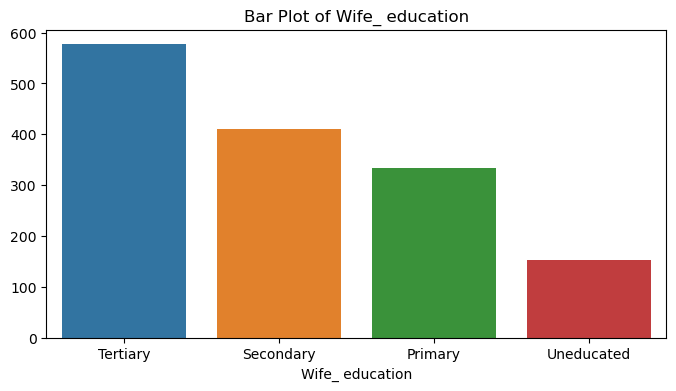

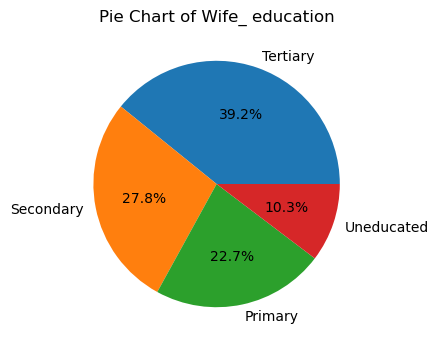

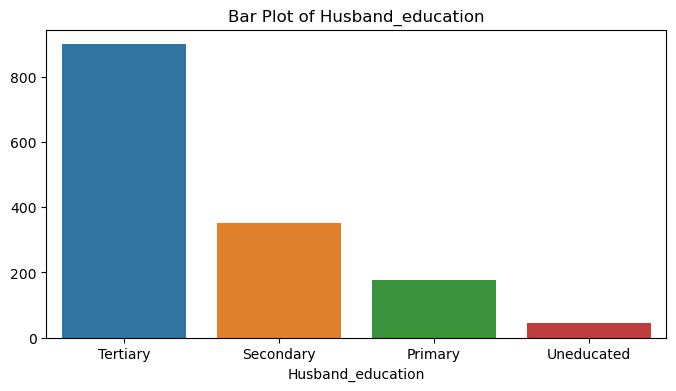

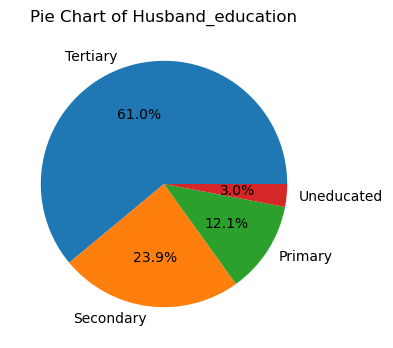

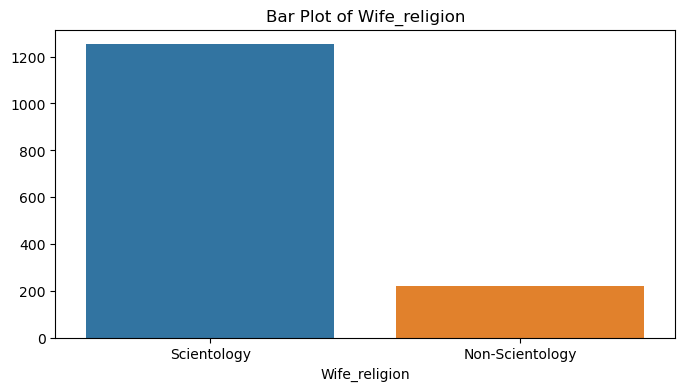

...

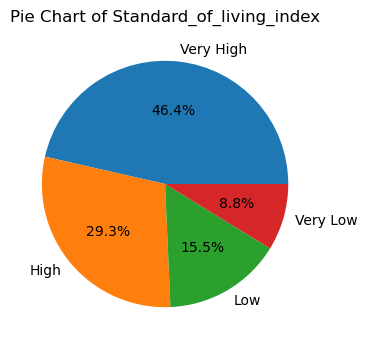

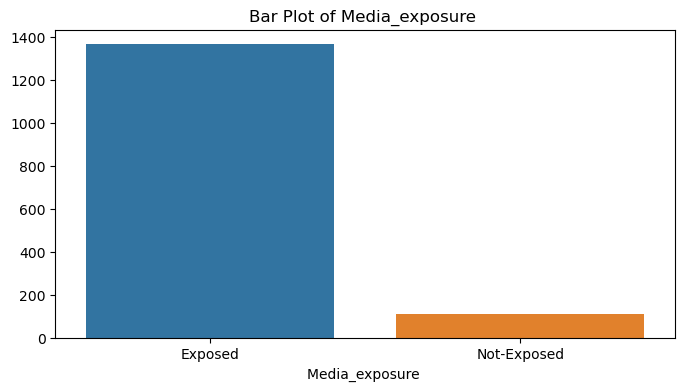

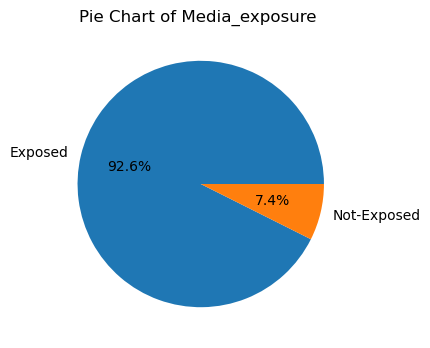

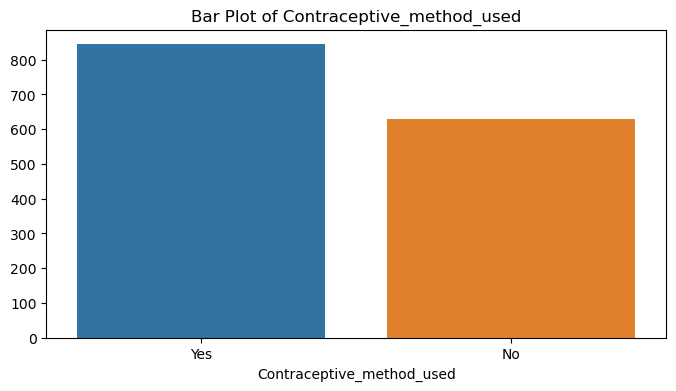

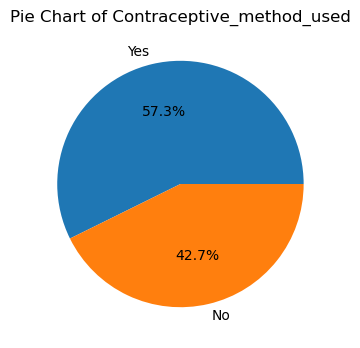

In [6]:
# Categorical columns
categorical_cols = data.select_dtypes(include=['object']).columns

# Univariate analysis for categorical columns
for col in categorical_cols:
  # Bar plot
  plt.figure(figsize=(8, 4))
  sns.barplot(x=data[col].value_counts().index, y=data[col].value_counts().values)
  plt.title(f'Bar Plot of {col}')
  plt.show()

  # Pie chart
  plt.figure(figsize=(8, 4))
  plt.pie(data[col].value_counts().values, labels=data[col].value_counts().index, autopct="%1.1f%%")
  plt.title(f'Pie Chart of {col}')
  plt.show()

### Multivariate analysis

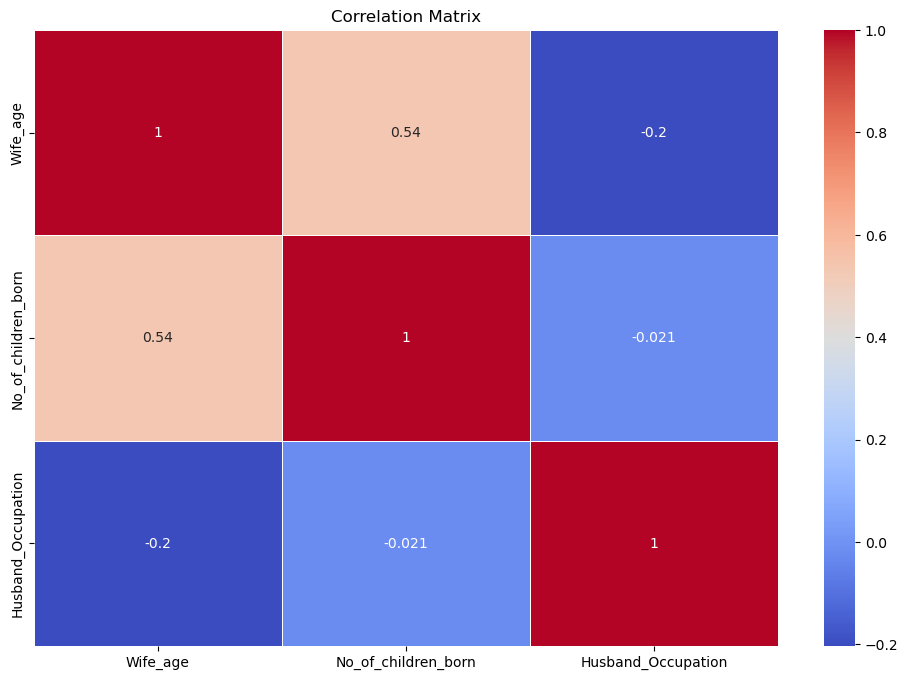

In [7]:
# Analyze relationships between variables, particularly focusing on the target variable.

numerical_data = data.select_dtypes(include=['int64', 'float64'])

# Correlation matrix
correlation_matrix = numerical_data.corr()

# Heat Map
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

<Figure size 1200x800 with 0 Axes>

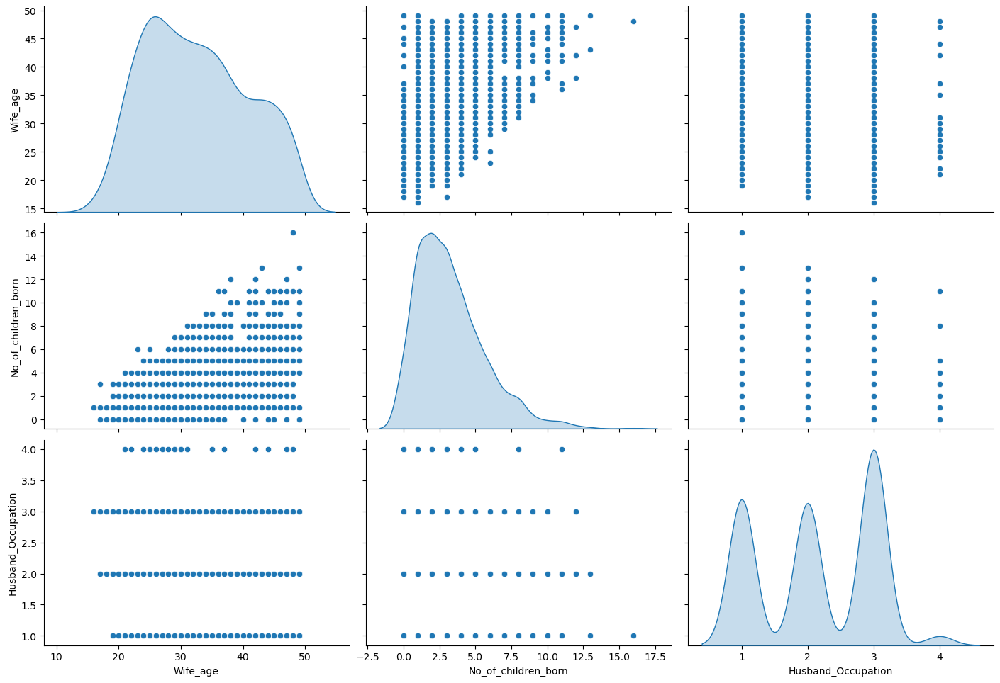

In [8]:
# Pairplot
plt.figure(figsize=(12, 8))
sns.pairplot(numerical_data, diag_kind='kde', height=2.5)
plt.gcf().set_size_inches(15, 10)
plt.show()

#### Insights

#### Variable Distributions:
- Wife's Age: The distribution is unimodal, with a peak around 30-35 years, indicating that most wives are in this age range.
- Number of Children Born: The distribution is right-skewed, with most families having between 0 and 5 children.
- Husband's Occupation: The distribution is multimodal, with peaks at occupation categories 1, 2, and 3, suggesting these are the most common occupation types.
#### Relationships Between Variables:
- Wife's Age and Number of Children Born: There is a moderate positive correlation, indicating that as the wife's age increases, the number of children born tends to increase.
- Wife's Age and Husband's Occupation: There is a weak relationship, with no clear pattern, suggesting that the wife's age does not strongly correlate with the husband's occupation category.
- Number of Children Born and Husband's Occupation: There is a weak relationship, with no clear pattern, indicating that the number of children born does not strongly correlate with the husband's occupation.
#### Implications:
 - Family Planning:
    The moderate positive correlation between Wife's Age and Number of Children Born can be useful in understanding family planning trends and targeting relevant age groups for interventions.
- Sociological Studies:
    The weak relationships between Husband's Occupation and the other variables suggest that factors other than age and number of children might influence occupation, warranting further investigation to understand any underlying sociological factors.
- Policy Making:
    Policymakers can use these insights to design programs that address the needs of different demographic groups based on age, family size, and occupation, ensuring targeted and effective interventions.



<Figure size 2000x1500 with 0 Axes>

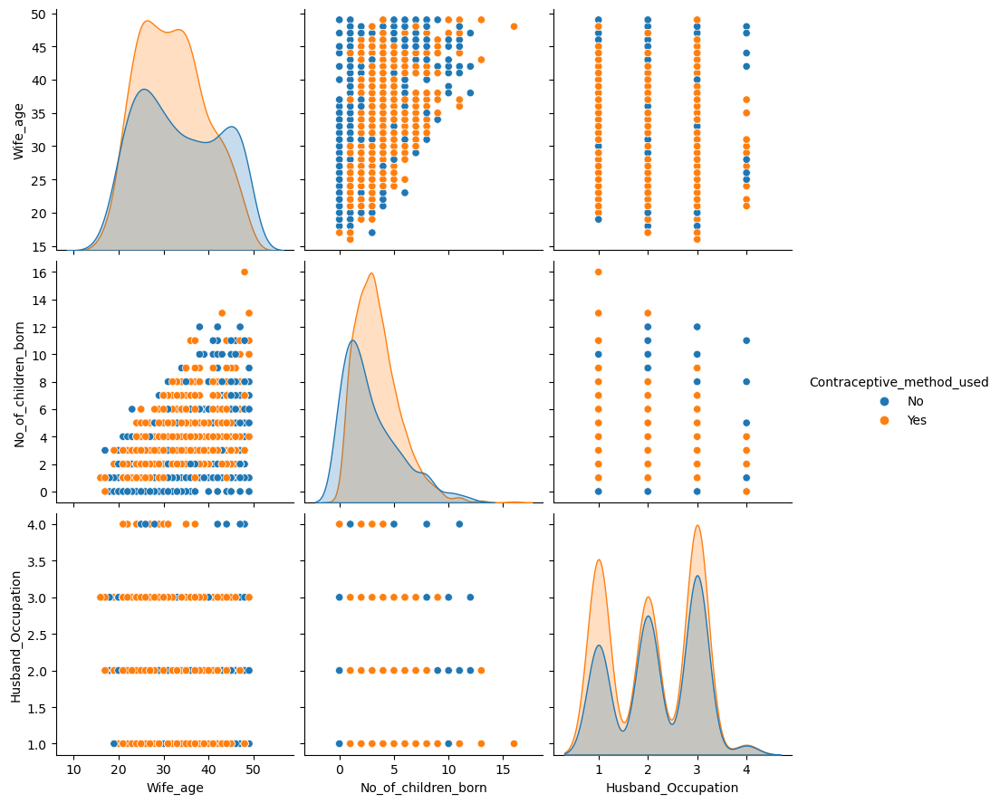

In [9]:
plt.figure(figsize=(20, 15))
sns.pairplot(data, hue='Contraceptive_method_used', height=3)
plt.show()

#### Insights

#### Wife's Age Distribution: 
    The KDE plot shows that the age distribution of wives using and not using contraceptive methods is quite similar, with peaks around the mid-20s to early 30s. However, there seems to be a higher density of contraceptive users in the younger age range.

#### Number of Children Born: 
    There is a clear trend where the number of children increases with the wife's age. Families with fewer children tend to use contraceptive methods more, as seen by the higher density of orange dots in the lower range of No_of_children_born.

#### Husband's Occupation: 
    The distribution of husbands' occupations shows distinct clusters at 1, 2, 3, and 4. There is a notable distribution of contraceptive method usage across different occupations, with no single occupation showing a clear preference.

#### Wife's Age vs. Number of Children Born: 
    The scatter plot shows an increasing trend of the number of children with the wife's age. Younger wives (age < 30) tend to have fewer children and are more likely to use contraceptive methods (orange dots).

#### Wife's Age vs. Husband's Occupation: 
    No clear trend is visible between the wife's age and the husband's occupation.

#### Number of Children Born vs. Husband's Occupation: 
    The scatter plot shows no strong relationship between the number of children born and the husband's occupation. Contraceptive usage appears evenly distributed across different occupations.

#### Use appropriate visualizations to identify the patterns and insights

- Above we have Histogram & box plot for Individual Numerical data and Bar plot & pie chart for Individual categorical data. 
- For Comparison of multple numerical data we have heatmap & pairplot.

### Key meaningful observations on individual variables and the relationship between variables

#### Insights:
- #### Wife_age:
    - Distribution: The distribution of ages is approximately unimodal, with a peak around the mid-20s to early 30s, indicating that this is the most common age range in the dataset.
    - Central Tendency: The median age is around 30 years old, meaning half the individuals are below 30 and half are above.
    - Spread and Range: The ages range from around 15 to 50 years old, with a wide spread of data points, though the density drops off significantly beyond 50 years old.
    - Symmetry and Skewness: The distribution is roughly symmetric, with a slight positive skew (longer right tail) towards the older ages.
    - Interquartile Range (IQR): The middle 50% of the ages fall between 25 and 38 years old, as indicated by the IQR.
    
- #### No_of_childern_born:
    - Right-Skewed Distribution of Number of Children Born: The distribution of the number of children born is right-skewed, indicating that most families have a smaller number of children, with fewer families having a larger number of children.
    - Central Tendency and Variability: The most common number of children born (mode) is around 2, but the average (mean) is likely higher due to the right-skewed distribution. The number of children born ranges from 0 to around 17, with a gradual decline in frequency as the number of children increases. There are a few outlier families with more than 10 children, which can affect the mean and standard deviation.
    - Median and Interquartile Range: The median number of children born is approximately 3, indicating that 50% of the families have 3 or fewer children, and the other 50% have more than 3 children. The interquartile range (IQR) shows the spread of the middle 50% of the data, providing insights into the variability of the number of children born.
    - Implications for Policy and Research: These insights into the distribution and variability of the number of children born can inform family planning policies, target interventions, and guide further sociological research on factors influencing family size.
    
- #### Husband_occupation:
    - Moderate Positive Correlation: There is a moderate positive correlation between Wife_age and No_of_children_born, indicating that as the wife's age increases, the number of children born tends to increase.
    - Weak Relationships: There are weak relationships between Wife_age and Husband_Occupation, as well as between No_of_children_born and Husband_Occupation, suggesting that factors other than age and number of children might influence occupation.
    - Most Common Occupation: The occupation category 3 has the highest density, making it the most common occupation among the data.
    - Median Occupation: The median occupation category is 2, meaning half of the occupations are below 2 and half are above 2.
    - Interquartile Range: The middle 50% of the occupation categories fall between 1.5 and 3.
    - Range of Data: The minimum occupation category is 1, and the maximum is 4.
    
- #### Wife_education:
    - Educational Attainment Distribution: The majority of wives (39.2%) have tertiary education, followed by secondary education (27.8%), primary education (22.7%), and the smallest group being uneducated (10.3%). This indicates that a significant portion of the population has pursued higher education, while a substantial number have also completed secondary school.
    - Positive Correlation between Wife's Age and Number of Children: There is a moderate positive correlation between the wife's age and the number of children born. This suggests that as the wife's age increases, the number of children born tends to increase as well.
    - Weak Relationships between Variables: The relationships between the wife's age and the husband's occupation, as well as the number of children born and the husband's occupation, are weak and do not show clear patterns. This implies that factors other than age and family size may be more influential in determining the husband's occupation.
    - Implications for Policymaking and Research: The insights on educational attainment and the relationship between age and family size can inform family planning policies and programs. The weak relationships between variables suggest the need for further sociological research to understand the underlying factors that influence occupation and family dynamics.
    
- #### Husband_education:
    - Educational Attainment Distribution: The majority of wives (39.2%) have tertiary education, followed by secondary education (27.8%), primary education (22.7%), and the smallest group being uneducated (10.3%). This indicates that a significant portion of the population has pursued higher education, while a substantial number have also completed secondary school.
    - Positive Correlation between Wife's Age and Number of Children: There is a moderate positive correlation between the wife's age and the number of children born. This suggests that as the wife's age increases, the number of children born tends to increase as well.
    - Weak Relationships between Variables: The relationships between the wife's age and the husband's occupation, as well as the number of children born and the husband's occupation, are weak and do not show clear patterns. This implies that factors other than age and family size may be more influential in determining the husband's occupation.
    - Implications for Policymaking and Research: The insights on educational attainment and the relationship between age and family size can inform family planning policies and programs. The weak relationships between variables suggest the need for further sociological research to understand the underlying factors that influence occupation and family dynamics.
    
- #### Wife_religion:
    - Dominance of Scientology Religion: The majority of wives (85.1%) belong to the Scientology religion, indicating it is the dominant religion in the population. The number of Scientology adherents (over 1,200 individuals) is significantly higher compared to the non-Scientology group (around 200 individuals).
    - Minimal Presence of Non-Scientology Religion: Only 14.9% of the population belongs to the non-Scientology religion, suggesting it has a relatively small presence compared to Scientology.
    - Potential Implications for Policy and Sociological Studies: The stark difference in the religious composition of the population may have implications for policymakers and sociologists in terms of understanding the cultural, social, and demographic dynamics of the community. Further investigation into the factors contributing to the dominance of Scientology and the relatively smaller presence of the non-Scientology religion could provide valuable insights for sociological research and policy development.

- #### Wife_working:
    - Majority of Wives are Non-Working: The data shows that the majority of wives, over 1,000 individuals, are non-working. Only around 400 wives out of the entire population are working, indicating that the number of working wives is significantly lower than non-working wives.
    - Low Percentage of Working Wives: The data suggests that only 25.1% of the entire population of wives are working. This means that the vast majority, around 75% of wives, are non-working.
    - Preference for Non-Working Roles: The data implies that the majority of wives, around 75% of the population, prefer to take on non-working roles rather than working roles. This suggests a cultural or societal preference for non-working wives in the given context.
    
- #### Standards_of_living_index:
    - Majority have Very High or High Standard of Living: The data shows that the largest group, comprising around 46% of the population, has a very high standard of living. The second-largest group, around 29% of the population, has a high standard of living.
    - Smaller Groups have Lower Standard of Living: A smaller group, around 15% of the population, has a low standard of living. The smallest group, around 9% of the population, has a very low standard of living.
    - Significant Disparity in Living Standards: The data reveals a significant disparity in the standard of living among the different groups, with the majority enjoying a very high or high standard of living, while smaller groups struggle with low or very low standards of living.
    - Potential for Targeted Interventions: These insights can inform policymakers and stakeholders to develop targeted interventions and programs to address the needs of the groups with lower standards of living, with the goal of reducing the overall disparity and improving the well-being of the entire population.

- #### Media_exposure:
    - Majority of the Population is Exposed to Media: he data shows that around 1,300 individuals are exposed to media, which represents the largest group of the population. he exposed group accounts for 92.6% of the total population, indicating that the vast majority of the population is aware of and has access to media.
    - nority of the Population is Not Exposed to Media:Only around 100 individuals are not exposed to media, representing the smallest group of the population. The non-exposed group accounts for 7.4% of the total population, suggesting that a very small portion of the population is not introduced to or aware of media.
    - Significant Disparity in Media Exposure: The data reveals a significant disparity between the exposed and non-exposed groups, with the exposed group being the dominant majority. This suggests that there may be barriers or challenges in reaching and engaging the non-exposed population, which could have implications for media accessibility, information dissemination, and social inclusion.

- #### Contraceptive_method_used:
    - Contraceptive Usage: More than 800 individuals (57% of the population) are using the contraceptive method. Around 600 individuals (43% of the population) are not using the contraceptive method.
    - Contraceptive Preference: The majority of the population (57%) prefer using the contraceptive method, indicating a higher adoption rate.
    - Contraceptive Non-Usage: A significant portion of the population (43%) are not using the contraceptive method, suggesting a need to understand the reasons behind this and address any barriers to access or acceptance.

#### Relationships Between Variables:
- #### Wife's Age and Number of Children Born:
    - The scatter plot shows an increasing trend, indicating that as the wife's age increases, the number of children born tends to increase. Younger wives (age < 30) tend to have fewer children and are more likely to use contraceptive methods.
- #### Wife's Age and Husband's Occupation:
    - The scatter plot shows no clear trend between the wife's age and the husband's occupation, suggesting a weak relationship.
- #### Number of Children Born and Husband's Occupation:
    - The scatter plot shows no strong relationship between the number of children born and the husband's occupation.Contraceptive usage appears to be evenly distributed across different occupation categories.
- #### Summary:
    - There is a moderate positive correlation between the wife's age and the number of children born, with younger wives tending to have fewer children and being more likely to use contraceptives.
    - The wife's age and the husband's occupation show a weak relationship, with no clear pattern.
    - The number of children born and the husband's occupation also exhibit a weak relationship, with contraceptive usage being evenly distributed across different occupation categories.

#### Implications:
- #### Family Planning:
    - The positive correlation between Wife_age and No_of_children_born can help in understanding family planning trends and targeting relevant age groups.
- #### Sociological Studies:
    - The weak relationships between occupation and the other variables suggest that factors other than age and number of children might influence occupation.
- #### Policy Making:
    - Policymakers can use these insights to design programs addressing the needs of different demographic groups based on age and family size.




## Problem 2 - Data Pre-processing

### Prepare the data for modelling: 
   - #### Missing Value Treatment (if needed) 
   - #### Outlier Detection (treat, if needed) 
   - #### Feature Engineering 
   - #### Encode the data 
   - #### Train-test split

In [10]:
# Finding missing values:
missing_values = data.isnull().sum()
print(missing_values)

Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64


In [11]:
# Two Variable had missing values.
# Missing Value Treatment by Imputing missing values with the mean of the column.
data['Wife_age'].fillna(data['Wife_age'].mean(), inplace=True)
data['No_of_children_born'].fillna(data['No_of_children_born'].mean(), inplace=True)
# checking again
missing_values = data.isnull().sum()
print(missing_values)

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64


In [12]:
#outlier detection
from scipy import stats
for col in numeric_cols:
    Q1 = np.percentile(data[col], 25, interpolation='midpoint')
    Q3 = np.percentile(data[col], 75, interpolation='midpoint')
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = data[~((data[col] >= lower_bound) & (data[col] <= upper_bound))]

# Print information about outliers
    print(f"Outliers for column '{col}':")
    print(f"  Number of outliers: {len(outliers)}")
    print(f"  Outlier values: {outliers[col].to_list()}")

# Treat outliers using mean
    mean = data[col].mean()
    data[col] = data[col].replace(to_replace=outliers[col].to_list(), value=mean)

# Print information after treatment
    print(f"After treating outliers:")
    print(f"  Mean of '{col}': {data[col].mean()}")

Outliers for column 'Wife_age':
  Number of outliers: 0
  Outlier values: []
After treating outliers:
  Mean of 'Wife_age': 32.606276747503564
Outliers for column 'No_of_children_born':
  Number of outliers: 45
  Outlier values: [10.0, 9.0, 9.0, 10.0, 10.0, 10.0, 12.0, 11.0, 11.0, 11.0, 10.0, 9.0, 10.0, 11.0, 13.0, 11.0, 10.0, 16.0, 13.0, 11.0, 9.0, 9.0, 9.0, 11.0, 9.0, 11.0, 12.0, 10.0, 9.0, 11.0, 9.0, 10.0, 11.0, 12.0, 12.0, 10.0, 10.0, 9.0, 9.0, 9.0, 9.0, 9.0, 11.0, 9.0, 9.0]
After treating outliers:
  Mean of 'No_of_children_born': 3.03786335863729
Outliers for column 'Husband_Occupation':
  Number of outliers: 0
  Outlier values: []
After treating outliers:
  Mean of 'Husband_Occupation': 2.1378139850644944


In [15]:
# Feature Engineerng
#    - We can create new feature like wife age group & husband age group.
#    - We can create Bin based on No_of_children_born.
# But i dont think neccesarity of doing so.

# Encoding the data
categorical_cols = data.select_dtypes(include=['object']).columns
print(categorical_cols)

data = pd.get_dummies(data, columns=categorical_cols, drop_first=True).astype(int)

data.head()

Index(['Wife_ education', 'Husband_education', 'Wife_religion', 'Wife_Working',
       'Standard_of_living_index', 'Media_exposure ',
       'Contraceptive_method_used'],
      dtype='object')


,Wife_age,No_of_children_born,Husband_Occupation,Wife_ education_Secondary,Wife_ education_Tertiary,Wife_ education_Uneducated,Husband_education_Secondary,Husband_education_Tertiary,Husband_education_Uneducated,Wife_religion_Scientology,Wife_Working_Yes,Standard_of_living_index_Low,Standard_of_living_index_Very High,Standard_of_living_index_Very Low,Media_exposure _Not-Exposed,Contraceptive_method_used_Yes
0,24,3,2,0,0,0,1,0,0,1,0,0,0,0,0,0
1,45,3,3,0,0,1,1,0,0,1,0,0,1,0,0,0
2,43,7,3,0,0,0,1,0,0,1,0,0,1,0,0,0
3,42,3,3,1,0,0,0,0,0,1,0,0,0,0,0,0
4,36,8,3,1,0,0,1,0,0,1,0,1,0,0,0,0


In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 16 columns):
 #   Column                              Non-Null Count  Dtype
---  ------                              --------------  -----
 0   Wife_age                            1473 non-null   int32
 1   No_of_children_born                 1473 non-null   int32
 2   Husband_Occupation                  1473 non-null   int32
 3   Wife_ education_Secondary           1473 non-null   int32
 4   Wife_ education_Tertiary            1473 non-null   int32
 5   Wife_ education_Uneducated          1473 non-null   int32
 6   Husband_education_Secondary         1473 non-null   int32
 7   Husband_education_Tertiary          1473 non-null   int32
 8   Husband_education_Uneducated        1473 non-null   int32
 9   Wife_religion_Scientology           1473 non-null   int32
 10  Wife_Working_Yes                    1473 non-null   int32
 11  Standard_of_living_index_Low        1473 non-null   int32
 12  Standa

In [17]:
# Train-test split
from sklearn.model_selection import train_test_split

# Define features and target variable
X = data.drop('Contraceptive_method_used_Yes', axis=1)
y = data[['Contraceptive_method_used_Yes']]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(1104, 15) (369, 15) (1104, 1) (369, 1)


## Problem 2 - Model Building and Compare the Performance of the Models

- ### Build a Logistic Regression Model
- ### Build a Linear Discriminant Analysis Model
- ### Build a CART Model
- ### Prune the CART Model by finding the best hyperparameters using GridSearch
- ### Check the performance of the models across train and test set using different metrics 
- ### Compare the performance of all the models built and choose the best one with proper rationale

In [18]:
# Building a Logistic Regression Model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

# Build the Logistic Regression model
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train, y_train)

# Predict and evaluate
y_pred_train = log_reg.predict(X_train)
y_pred_test = log_reg.predict(X_test)

print("\nLogistic Regression - Train Classification Report:\n", classification_report(y_train, y_pred_train))
print("\nLogistic Regression - Test Classification Report:\n", classification_report(y_test, y_pred_test))



Logistic Regression - Train Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.51      0.58       468
           1       0.70      0.82      0.75       636

    accuracy                           0.69      1104
   macro avg       0.69      0.67      0.67      1104
weighted avg       0.69      0.69      0.68      1104


Logistic Regression - Test Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.48      0.58       161
           1       0.68      0.87      0.76       208

    accuracy                           0.70       369
   macro avg       0.71      0.67      0.67       369
weighted avg       0.70      0.70      0.68       369



In [19]:
# Building a Linear Discriminant Analysis model

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis()
lda.fit(X_train, y_train)

# Predict and evaluate
y_pred_train_lda = lda.predict(X_train)
y_pred_test_lda = lda.predict(X_test)

print("\nLDA - Train Classification Report:\n", classification_report(y_train, y_pred_train_lda))
print("\nLDA - Test Classification Report:\n", classification_report(y_test, y_pred_test_lda))


LDA - Train Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.50      0.58       468
           1       0.69      0.82      0.75       636

    accuracy                           0.69      1104
   macro avg       0.68      0.66      0.66      1104
weighted avg       0.69      0.69      0.68      1104


LDA - Test Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.46      0.56       161
           1       0.67      0.87      0.76       208

    accuracy                           0.69       369
   macro avg       0.70      0.66      0.66       369
weighted avg       0.70      0.69      0.67       369



In [20]:
# Building a CART Model
from sklearn.tree import DecisionTreeClassifier

cart = DecisionTreeClassifier(random_state=42)
cart.fit(X_train, y_train)

# Predict and evaluate
y_pred_train_cart = cart.predict(X_train)
y_pred_test_cart = cart.predict(X_test)

print("\nCART - Train Classification Report:\n", classification_report(y_train, y_pred_train_cart))
print("\nCART - Test Classification Report:\n", classification_report(y_test, y_pred_test_cart))


CART - Train Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       468
           1       0.99      0.97      0.98       636

    accuracy                           0.98      1104
   macro avg       0.98      0.98      0.98      1104
weighted avg       0.98      0.98      0.98      1104


CART - Test Classification Report:
               precision    recall  f1-score   support

           0       0.61      0.58      0.59       161
           1       0.69      0.71      0.70       208

    accuracy                           0.65       369
   macro avg       0.65      0.65      0.65       369
weighted avg       0.65      0.65      0.65       369



In [21]:
# Prune the CART Model using GridSearch

from sklearn.model_selection import GridSearchCV

param_grid = {'max_depth': [3, 5, 7, 10], 'min_samples_split': [2, 5, 10]}

# Perform GridSearch
grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Best parameters
best_params = grid_search.best_params_
print("\nBest parameters for CART:", best_params)

# Build the pruned CART model
pruned_cart = DecisionTreeClassifier(**best_params, random_state=42)
pruned_cart.fit(X_train, y_train)

# Predict and evaluate
y_pred_train_pruned_cart = pruned_cart.predict(X_train)
y_pred_test_pruned_cart = pruned_cart.predict(X_test)

print("\nPruned CART - Train Classification Report:\n", classification_report(y_train, y_pred_train_pruned_cart))
print("\nPruned CART - Test Classification Report:\n", classification_report(y_test, y_pred_test_pruned_cart))



Best parameters for CART: {'max_depth': 7, 'min_samples_split': 2}

Pruned CART - Train Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.55      0.66       468
           1       0.74      0.93      0.82       636

    accuracy                           0.77      1104
   macro avg       0.79      0.74      0.74      1104
weighted avg       0.78      0.77      0.75      1104


Pruned CART - Test Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.47      0.58       161
           1       0.68      0.87      0.76       208

    accuracy                           0.70       369
   macro avg       0.71      0.67      0.67       369
weighted avg       0.71      0.70      0.68       369



#### Model Evalution
- We are going to use metrics like accuracy, precision, recall, and F1-score to evaluate model performance on both training and testing sets.

#### Logistic Regression 
- Train Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.51      0.58       468
           1       0.70      0.82      0.75       636

    accuracy                           0.69      1104
   macro avg       0.69      0.67      0.67      1104
weighted avg       0.69      0.69      0.68      1104


- Test Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.48      0.58       161
           1       0.68      0.87      0.76       208

    accuracy                           0.70       369
   macro avg       0.71      0.67      0.67       369
weighted avg       0.70      0.70      0.68       369

#### LDA 
- Train Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.50      0.58       468
           1       0.69      0.82      0.75       636

    accuracy                           0.69      1104
   macro avg       0.68      0.66      0.66      1104
weighted avg       0.69      0.69      0.68      1104


- Test Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.46      0.56       161
           1       0.67      0.87      0.76       208

    accuracy                           0.69       369
   macro avg       0.70      0.66      0.66       369
weighted avg       0.70      0.69      0.67       369

#### CART 
- Train Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       468
           1       0.99      0.97      0.98       636

    accuracy                           0.98      1104
   macro avg       0.98      0.98      0.98      1104
weighted avg       0.98      0.98      0.98      1104


- Test Classification Report:
               precision    recall  f1-score   support

           0       0.61      0.58      0.59       161
           1       0.69      0.71      0.70       208

    accuracy                           0.65       369
   macro avg       0.65      0.65      0.65       369
weighted avg       0.65      0.65      0.65       369

#### Pruned CART 
- Train Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.55      0.66       468
           1       0.74      0.93      0.82       636

    accuracy                           0.77      1104
   macro avg       0.79      0.74      0.74      1104
weighted avg       0.78      0.77      0.75      1104


- Test Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.47      0.58       161
           1       0.68      0.87      0.76       208

    accuracy                           0.70       369
   macro avg       0.71      0.67      0.67       369
weighted avg       0.71      0.70      0.68       369


#### Metrics Summary
- Logistic Regression
    - Train Accuracy: 0.69
    - Test Accuracy: 0.70
    - Train Precision: 0.68 (class 0), 0.70 (class 1)
    - Test Precision: 0.73 (class 0), 0.68 (class 1)
    - Train Recall: 0.51 (class 0), 0.82 (class 1)
    - Test Recall: 0.48 (class 0), 0.87 (class 1)
    - Train F1-Score: 0.58 (class 0), 0.75 (class 1)
    - Test F1-Score: 0.58 (class 0), 0.76 (class 1)
- Linear Discriminant Analysis (LDA)
    - Train Accuracy: 0.69
    - Test Accuracy: 0.69
    - Train Precision: 0.68 (class 0), 0.69 (class 1)
    - Test Precision: 0.73 (class 0), 0.67 (class 1)
    - Train Recall: 0.50 (class 0), 0.82 (class 1)
    - Test Recall: 0.46 (class 0), 0.87 (class 1)
    - Train F1-Score: 0.58 (class 0), 0.75 (class 1)
    - Test F1-Score: 0.56 (class 0), 0.76 (class 1)
- CART
    - Train Accuracy: 0.98
    - Test Accuracy: 0.65
    - Train Precision: 0.97 (class 0), 0.99 (class 1)
    - Test Precision: 0.61 (class 0), 0.69 (class 1)
    - Train Recall: 0.99 (class 0), 0.97 (class 1)
    - Test Recall: 0.58 (class 0), 0.71 (class 1)
    - Train F1-Score: 0.98 (class 0), 0.98 (class 1)
    - Test F1-Score: 0.59 (class 0), 0.70 (class 1)
- Pruned CART
    - Train Accuracy: 0.77
    - Test Accuracy: 0.70
    - Train Precision: 0.84 (class 0), 0.74 (class 1)
    - Test Precision: 0.74 (class 0), 0.68 (class 1)
    - Train Recall: 0.55 (class 0), 0.93 (class 1)
    - Test Recall: 0.47 (class 0), 0.87 (class 1)
    - Train F1-Score: 0.66 (class 0), 0.82 (class 1)
    - Test F1-Score: 0.58 (class 0), 0.76 (class 1)
    
#### Comparison and Rationale
- Accuracy:
    - Logistic Regression and Pruned CART have the highest test accuracy (0.70), followed closely by LDA (0.69).
    - CART has a lower test accuracy (0.65) despite having an extremely high train accuracy (0.98), indicating overfitting.
- Precision, Recall, and F1-Score:
    - For class 1 (target class), Pruned CART and Logistic Regression perform similarly well in terms of test F1-score (0.76), indicating a balance between precision and recall.
    - For class 0, Pruned CART has slightly better test precision (0.74) compared to Logistic Regression (0.73) and LDA (0.73), but Logistic Regression has higher recall (0.48 vs. 0.47 for Pruned CART).
- Overfitting:
    - CART shows clear signs of overfitting with a huge gap between train and test performance.
    - Pruned CART addresses overfitting to some extent, maintaining a balance between train and test performance.

#### Conclusion:
#### Best Model: Pruned CART

- Rationale: Pruned CART provides a good balance of performance metrics, effectively addressing the overfitting issue observed with the unpruned CART model. It achieves the highest test accuracy along with Logistic Regression and has competitive precision, recall, and F1-scores. Additionally, decision trees are interpretable and can provide valuable insights into the feature importance.

#### Alternative: Logistic Regression

- Rationale: Logistic Regression also performs well, with similar accuracy and F1-scores to Pruned CART. It's a simpler model that is easier to interpret and can be a good choice if interpretability and simplicity are priorities.

## Problem 2 -  Business Insights & Recommendations

- ### Comment on the importance of features based on the best model
- ### Conclude with the key takeaways (actionable insights and recommendations) for the business

In [25]:
# Extracting feature importances
feature_importances = pruned_cart.feature_importances_
feature_names = X_train.columns

# Creating a DataFrame for better visualization
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)
print(importance_df)


                               Feature  Importance
1                  No_of_children_born    0.373766
0                             Wife_age    0.328257
4             Wife_ education_Tertiary    0.127555
12  Standard_of_living_index_Very High    0.036042
2                   Husband_Occupation    0.024444
9            Wife_religion_Scientology    0.023753
3            Wife_ education_Secondary    0.020272
6          Husband_education_Secondary    0.015999
10                    Wife_Working_Yes    0.014812
13   Standard_of_living_index_Very Low    0.012924
14         Media_exposure _Not-Exposed    0.011924
7           Husband_education_Tertiary    0.007976
8         Husband_education_Uneducated    0.002274
5           Wife_ education_Uneducated    0.000000
11        Standard_of_living_index_Low    0.000000


#### Analysis of Feature Importance
- Number of Children Born (0.373766):
    - Importance: Highest importance in predicting contraceptive use.
    - Insight: Families with more children are more likely to use contraceptives. This suggests that educational campaigns about family planning should target families with fewer children, highlighting the benefits of contraceptives.
- Wife's Age (0.328257):
    - Importance: Second highest importance.
    - Insight: Younger or older women might have different contraceptive needs. Tailoring messages to different age groups can improve the adoption of contraceptive methods.
- Wife's Education - Tertiary (0.127555):
    - Importance: Significant importance.
    - Insight: Higher education levels in women correlate with contraceptive use. Programs to promote female education can indirectly increase contraceptive use.
- Standard of Living - Very High (0.036042):
    - Importance: Moderate importance.
    - Insight: Higher standard of living leads to higher contraceptive use. This implies that improving the overall standard of living can have a positive impact on contraceptive adoption.
- Husband's Occupation (0.024444):
    - Importance: Low importance.
    - Insight: While not highly important, the husband's occupation can still influence contraceptive use. Understanding the occupations that are less likely to use contraceptives can help in targeted interventions.
    
#### Conclude with Key Takeaways (Actionable Insights and Recommendations):

Based on the feature importance and the insights drawn, here are the actionable recommendations:

- Focus on Families with More Children:
    - Develop targeted campaigns emphasizing the benefits of contraceptives for families with multiple children. Highlighting how contraceptives can help in better managing family size and improving quality of life can be effective.
- Tailor Messaging to Different Age Groups:
    - Create age-specific educational materials and programs. Younger women might be more interested in the health benefits and future family planning, while older women might focus on economic stability and existing family management.
- Promote Female Education:
    - Increase efforts to promote tertiary education for women. Education has a strong correlation with contraceptive use, so investing in female education can have long-term benefits for family planning.
- Improve Standard of Living:
    - Work on policies and programs that enhance the standard of living. Better economic conditions and access to resources will likely lead to increased contraceptive use.
- Understand Occupational Influence:
    - Study the specific occupations of husbands that show lower contraceptive use. Develop occupation-specific interventions to address misconceptions or barriers related to contraceptive use in those occupations.
- Address Religious and Cultural Factors:
    - Since religion and cultural factors have some influence, work with community leaders to promote contraceptive use within cultural and religious contexts. Ensuring that the messages are culturally sensitive will enhance acceptance.
- Enhance Media Exposure:
    - Media exposure is relatively less important but still plays a role. Increase the accessibility and quality of information about contraceptives through various media channels. Utilize social media, TV, and radio to spread awareness.

#### Conclusion:
- By focusing on these key areas, the Republic of Indonesia Ministry of Health can effectively promote the use of contraceptives among married women. Targeted educational campaigns, improving socioeconomic conditions, and leveraging cultural contexts can lead to better adoption rates and improved family planning outcomes.